In [4]:
import os
import pandas as pd
import numpy as np
import datetime
import math
import empyrical as empy
from sklearn.metrics import precision_score, accuracy_score, confusion_matrix, mean_squared_error

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

import warnings
warnings.filterwarnings("ignore")

In [5]:
def drawdown_from_price(price):
    if isinstance(price, pd.Series):
        return _drawdown_from_price(price)
    elif isinstance(price, pd.DataFrame):
        return price.apply(_drawdown_from_price)
    else:
        raise non_pd_error

def _drawdown_from_price(price):
    shift_max = price.copy()
    _max = price.iloc[0]
    for i, j in price.items():
        #print('i', i)
        #print('j', j)
        _max = max(_max, j)
        shift_max[i] = _max
    return price / shift_max - 1

def return_to_price(ret, ini=100):
    price_0 = ret.iloc[:1] * 0 + ini
    price_0.index = [0]
    price = (1+ret).cumprod() * ini
    return pd.concat([price_0, price])

def drawdown_from_return(ret, ini=100):
    price = return_to_price(ret, ini)
    return drawdown_from_price(price).iloc[1:]

def avg_drawdown(ret):
    dd = drawdown_from_return(ret)
    return dd.mean()


def other_metric(ret, true_up=None, true_ret=None):
    if isinstance(ret, pd.DataFrame):
        return ret.apply(other_metric, true_up=true_up, true_ret=true_ret).T
    se = pd.Series(dtype='float64')
    pred_up = (ret!=0)*1
    highlight_ratio = pred_up.mean()
    flip_ratio = (pred_up - pred_up.shift()).abs().mean()

    se['buy_ratio'] = highlight_ratio
    se['flip_ratio'] = flip_ratio
    
    if true_up is not None and true_ret is not None:
        idx_tmp = pred_up.index & true_up.index
        true_up_tmp = true_up.reindex(idx_tmp) * 1
        pred_up = pred_up.reindex(idx_tmp) * 1

        accu = accuracy_score(true_up_tmp, pred_up)
        prec = precision_score(true_up_tmp, pred_up)
        
        true_up_pct = true_ret.reindex(idx_tmp)
        true_up_pct_scaled = true_up_pct/true_up_pct.std() + 0.5
        
        mse = mean_squared_error(true_up_pct_scaled, pred_up)

        se['accu'] = accu
        se['prec'] = prec
        se['mse'] = mse
    
    return se


def empy_metric(ret):
    if isinstance(ret, pd.DataFrame):
        return ret.apply(empy_metric).T
    total_return = lambda x: (1+x).prod()-1
    met_func = [total_return, empy.annual_return, empy.sharpe_ratio, empy.annual_volatility, 
                empy.max_drawdown, avg_drawdown]
    
    met_func_names = ['total_return', 'annual_return', 'sharpe_ratio', 'annual_volatility', 
                      'max_drawdown', 'avg_drawdown',]
    
    se = pd.Series([f(ret) for f in met_func], met_func_names)
    
    se['return/maxdd'] = -se.annual_return/se.max_drawdown
    se['return/avgdd'] = -se.annual_return/se.avg_drawdown
    
    return se

client_weight_agg = {'sharpe_ratio':5,'annual_return':5, 'max_drawdown':5}
def calculation_score(df, client_weight=client_weight_agg):
    df['Sharpe Score'] = df['sharpe_ratio'].apply(lambda x: x if x>0 else 0) * 100
    df['Return Score'] = df['annual_return'].apply(lambda x: 1+x/2) * 100
    df['Max-DD Score'] = df['max_drawdown'].apply(lambda x: 1+x) * 100

    df['Total Score'] = 0
    for score, weight in client_weight.items():
        df['Total Score'] += weight * df[score]
    return df


def show_cum_ret(ret_df):
    fig, ax = plt.subplots(figsize=(20,15))
    
    cm = plt.get_cmap('gist_rainbow')
    NUM_COLORS = ret_df.shape[1]
    ax.set_prop_cycle(color=[cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)])


    (1+ret_df).cumprod().plot(ax=ax)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.set_yscale("log")
    plt.show()


def print_all_result(ret_df, true_up, true_ret, proba_df=None, topn=10, strategy_list_sel=None, base_case=None):
    
    display('{} to {}'.format(ret_df.index[0], ret_df.index[-1]))
    column_selected = ['total_return', 'annual_return', 'sharpe_ratio', 'max_drawdown', 'avg_drawdown', 'return/avgdd',]
    empy_metric_tmp = empy_metric(ret_df).sort_values('sharpe_ratio')
    # print(empy_metric_tmp.loc[['buy_and_hold']])
    if strategy_list_sel is None:
        empy_metric_tmp = empy_metric(ret_df).sort_values('sharpe_ratio')
        if isinstance(topn, int):
            strategy_list_sel = list(empy_metric_tmp.index)
            strategy_list_sel = strategy_list_sel[-topn:]
        else:
            strategy_list_sel = list(empy_metric_tmp.loc[topn:].index)
    else:
        if base_case is not None:
            usecols = list(set(strategy_list_sel + base_case))
        else:
            usecols = strategy_list_sel
        empy_metric_tmp = empy_metric(ret_df[usecols]).sort_values('sharpe_ratio')

    # if ('buy_and_hold') in strategy_list_sel:
    #     strategy_list_sel = [x for x in strategy_list_sel if x !='buy_and_hold']
    
    base_list = []
    if (base_case is not None) and (len(base_case) > 0):
        base_list = list(empy_metric_tmp.loc[base_case, :].index)
        for bc in base_list:
            if bc in strategy_list_sel:
                strategy_list_sel.remove(bc)

    strategy_list_sel = base_list + strategy_list_sel
    other_metric_tmp = other_metric(ret_df[strategy_list_sel], true_up, true_ret)
    
    display(other_metric_tmp.loc[strategy_list_sel[1:]].iloc[:,:5])
    display(empy_metric_tmp.loc[strategy_list_sel][column_selected])
    
    plot_cum_return(ret_df[strategy_list_sel])
    
#     cvals  = [0, 0.5, 1]
#     colors = ["red", 'white', "lawngreen"]
#     cmap = LinearSegmentedColormap.from_list("", colors)
#     norm=plt.Normalize(min(cvals),max(cvals))
#     tuples = list(zip(map(norm,cvals), colors))
#     cmap = LinearSegmentedColormap.from_list("", tuples)
#     sm = plt.cm.ScalarMappable(cmap=cmap)#, norm=norm
#     sm.set_array([])

    
    if proba_df is None:
        return strategy_list_sel

    alpha = 1
    dot_size = 20
    
    base_cumret = (1+ret_df[base_case]).cumprod().apply(math.log)
    base_cumret.name = 'buy_and_hold'
    
    for case in strategy_list_sel:
        if case not in proba_df.columns:
            continue
        print("====================================", case)
#         try:
        if True:
            df_temp = pd.concat([ret_df[case], proba_df[case]],1,keys=['return','pred prob']).dropna()

    #         df_temp['log return'] = (1+df_temp['return']).apply(math.log)
    #         df_temp['cumulative return'] = (1+df_temp['return']).cumprod()-1
            df_temp['log cumulative return'] = (1+df_temp['return']).cumprod().apply(math.log)

            z_ret = ret_df[case]/ret_df[case].std()
            z_prod = (proba_df[case]-0.5)/proba_df[case].std()
            df_temp['score'] = 3-abs(z_ret-z_prod)

            df_temp = df_temp.reset_index()
            df_temp['date'] = pd.to_datetime(df_temp['date'])
            
#             display(df_temp)
            
            plot_hue = 'pred prob'
        
            cvals  = [0,0.5,1]
            colors = ["red","white","lawngreen"]
            norm = plt.Normalize(min(cvals),max(cvals))
            tuples = list(zip(map(norm,cvals), colors))
            cmap_prob = LinearSegmentedColormap.from_list("", tuples)
            sm_prob = plt.cm.ScalarMappable(cmap=cmap_prob, norm=norm)
            sm_prob.set_array([])
            
            fig, ax = plt.subplots(figsize=(20,15))
            ax = sns.scatterplot(data=df_temp, x='date', y='log cumulative return', hue=plot_hue,
                                 #hue='score', alpha=0.5, palette=cmap, s=20)
                                 alpha=0.5, palette=cmap_prob, s=dot_size
#                                  cmap=cmap_prob
                                )
            base_cumret.plot(ax=ax)

            ax.set_xlim([df_temp['date'].iloc[0], df_temp['date'].iloc[-1]])
            ax.get_legend()#.remove()
#             ax.set_yscale("log")
            ax.figure.colorbar(sm_prob)
            ax.set_title("{} {}".format(case, plot_hue))
            plt.show()
            
#             fig, ax = plt.subplots(figsize=(12,10))
#             proba_df.loc[ret_df.index, case].plot(kind='bar', ax=ax, legend=False)
# #             ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
#             ax.set_title(case + ' proba')
#             plt.show()
#         except Exception as e:
#             print(e)
#             continue
    
    
    return strategy_list_sel

In [6]:
all_met_df_dict = {}
all_ret_df_dict = {}

# Sliding with yearly

In [43]:
base_folder = './result/2022/cashON_signal/result/combine_all/'

start = '2008'
end = '2022'

In [44]:
all_ret = {}
all_met = {}
for sliding_case_name in os.listdir(base_folder):
    
    if sliding_case_name != 'withAssetSliding_13ETFs':
        continue
    case_folder = os.path.join(base_folder, sliding_case_name)
    if not os.path.isdir(case_folder):
        continue
    for f in os.listdir(case_folder):
        try:
            case_type2 = f.split('_')
            if len(case_type2) > 2:
                case_type2 = [case_type2[0], "_".join(case_type2[1:])]
            # case_type2 = [sliding_case_name] + case_type2
            # if len(case_type2) > 2:
            #     case_type2 = [case_type2[0], "_".join(case_type2[1:])]
            print(case_type2)

            ret = pd.read_csv(os.path.join(case_folder, f, 'final_ret.csv'), index_col=0)
            names = ['case_metrics', 'case_combine']
            ret.columns = pd.MultiIndex.from_tuples([idx.rsplit("_", 1) if idx != "no_3vote" else ["", "no_3vote"] for idx in ret.columns], names=names)
            ret.index = pd.to_datetime(ret.index)
            all_ret[tuple(case_type2)] = ret
            met = pd.read_csv(os.path.join(case_folder, f, 'final_metrics.csv'), index_col=0)
            names = ['case_metrics', 'case_combine']
            met.index = pd.MultiIndex.from_tuples([idx.rsplit("_", 1) if idx != "no_3vote" else ["", "no_3vote"] for idx in met.index], names=names)
            all_met[tuple(case_type2)] = met
        except Exception as e:
            print("Failed for {}".format(f))
            print(e)
    # break
all_ret_df = pd.concat(all_ret.values(), keys=all_ret.keys(), axis=1)
# all_met_df = pd.concat(all_met.values(), keys=all_met.keys())

['performance1YExclude1&2Y', 'CorrOnly']
['performance1YExclude1&2Y', 'CorrVol']
['performance1YExclude1&2Y', 'VolOnly']
['performance1Y', 'CorrOnly']
['performance1Y', 'CorrVol']
['performance1Y', 'VolOnly']
['performanceSlidingYearExclude1&2Y', 'CorrOnly']
['performanceSlidingYearExclude1&2Y', 'CorrVol']
['performanceSlidingYearExclude1&2Y', 'VolOnly']
['performanceSlidingYear', 'CorrOnly']
['performanceSlidingYear', 'CorrVol']
['performanceSlidingYear', 'VolOnly']


In [45]:
# 13ETFs	v1	sliding1Y	2thresholds	combine2	no_3vote
idx_names = ['sliding_year', 'case_pool', 'case_metrics', 'case_combine']
all_ret_df.columns.names = idx_names
# all_met_df.index.names = idx_names
all_ret_df_dict[sliding_case_name] = all_ret_df
all_ret_df.dropna()

sliding_year performance1YExclude1&2Y                                   \
case_pool                    CorrOnly                                    
case_metrics              Total Score sharpe_ratio                       
case_combine                 combine1     combine1  combine2  no_3vote   
2011-01-03                   0.004444     0.004444  0.004444  0.004444   
2011-01-04                  -0.007658    -0.007658 -0.007658 -0.007658   
2011-01-05                  -0.000512    -0.000512 -0.000194 -0.000512   
2011-01-06                  -0.001586    -0.001586 -0.001780 -0.001586   
2011-01-07                   0.001088     0.001088  0.001088  0.001088   
...                               ...          ...       ...       ...   
2022-07-25                  -0.000582    -0.000582 -0.000582 -0.000582   
2022-07-26                  -0.002362    -0.002362 -0.002362 -0.002362   
2022-07-27                   0.009400     0.009400  0.009400  0.009400   
2022-07-28                   0.009597     0.009597  0.009597  0.009597   
2022-07-29                   0.003906     0.003906  0.003906  0.003906   

sliding_year                                                             \
case_pool                                          CorrVol                
case_metrics Total Score            sharpe_ratio           sharpe_ratio   
case_combine    combine2 combine1+2   combine1+2  no_3vote     combine1   
2011-01-03      0.004444   0.004444     0.004444  0.004444     0.004444   
2011-01-04     -0.007658  -0.007658    -0.007658 -0.007658    -0.007658   
2011-01-05     -0.000194  -0.000194    -0.000194 -0.000512    -0.000512   
2011-01-06     -0.001780  -0.001780    -0.001780 -0.001586    -0.001586   
2011-01-07      0.001088   0.001088     0.001088  0.001088     0.001088   
...                  ...        ...          ...       ...          ...   
2022-07-25     -0.000582  -0.000582    -0.000582 -0.000582    -0.000582   
2022-07-26     -0.002362  -0.002362    -0.002362 -0.002362    -0.002362   
2022-07-27      0.009400   0.009400     0.009400  0.009400     0.009400   
2022-07-28      0.009597   0.009597     0.009597  0.009597     0.009597   
2022-07-29      0.003906   0.003906     0.003906  0.003906     0.003906   

sliding_year              ... performanceSlidingYear                           \
case_pool                 ...                CorrVol                            
case_metrics Total Score  ...                        sharpe_ratio Total Score   
case_combine    combine2  ...               no_3vote   combine1+2    combine2   
2011-01-03      0.004444  ...               0.004444     0.004444    0.004444   
2011-01-04     -0.007658  ...              -0.007658    -0.007658   -0.007658   
2011-01-05     -0.000194  ...              -0.000512    -0.000512   -0.000512   
2011-01-06     -0.001780  ...              -0.001586    -0.001586   -0.001586   
2011-01-07      0.001088  ...               0.001088    -0.000194   -0.000194   
...                  ...  ...                    ...          ...         ...   
2022-07-25     -0.000582  ...              -0.000582     0.000000    0.000000   
2022-07-26     -0.002362  ...              -0.002362     0.000000    0.000000   
2022-07-27      0.009400  ...               0.009400     0.000000    0.000000   
2022-07-28      0.009597  ...               0.009597     0.000000    0.000000   
2022-07-29      0.003906  ...               0.003906     0.000000    0.000000   

sliding_year                                                           \
case_pool        VolOnly                                                
case_metrics Total Score           sharpe_ratio           Total Score   
case_combine  combine1+2  combine2     combine2  no_3vote    combine1   
2011-01-03      0.004267  0.004267     0.004267  0.004444   -0.000176   
2011-01-04     -0.000197 -0.000197    -0.000197 -0.007658   -0.007853   
2011-01-05      0.000000  0.000000     0.000000 -0.000512   -0.000512   
2011-01-06      0.000000  0.000000  

#### 2009-2022

In [46]:
all_met_df = empy_metric(all_ret_df.dropna())
all_met_df = calculation_score(all_met_df)
all_met_df = pd.concat([all_met_df, other_metric(all_ret_df.dropna())], axis=1)
all_met_df_dict[sliding_case_name] = all_met_df

In [47]:
base_case_name = 'no_3vote'
base_case_ret = all_ret_df.loc[:, all_ret_df.columns.get_level_values('case_combine') == base_case_name].iloc[:, [0]]
base_case_ret.columns = pd.MultiIndex.from_tuples([("", "", "", base_case_name)], names=idx_names)
# display(base_case_ret)
base_case_met = all_met_df.loc[all_met_df.index.get_level_values('case_combine') == base_case_name, :].iloc[[0], :]
base_case_met.index = pd.MultiIndex.from_tuples([("", "", "", base_case_name)], names=idx_names)
base_case_met

,,,,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
sliding_year,case_pool,case_metrics,case_combine,,,,,,,,,,,,,,
,,,no_3vote,1.753444,0.091574,0.727745,0.132509,-0.222995,-0.057895,0.410654,1.581719,72.774507,104.578695,77.70045,2.981617,1.0,0.0


In [48]:
sort_by = 'sharpe_ratio'
sort_df = all_met_df.sort_values(sort_by, ascending=False)
# sort_df
show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
show_df = pd.concat([base_case_met, show_df])
show_df.head(20)

total_return  \
sliding_year                      case_pool case_metrics case_combine                 
                                                         no_3vote          1.753444   
performanceSlidingYearExclude1&2Y CorrOnly  Total Score  combine1          2.603161   
                                            sharpe_ratio combine1          2.440639   
                                  CorrVol   Total Score  combine1          1.831633   
                                            sharpe_ratio combine1          1.694421   
                                  VolOnly   sharpe_ratio combine1          1.534081   
performance1YExclude1&2Y          CorrOnly  sharpe_ratio combine2          1.328638   

                                                                       annual_return  \
sliding_year                      case_pool case_metrics case_combine                  
                                                         no_3vote           0.091574   
performanceSlidingYearExclude1&2Y CorrOnly  Total Score  combine1           0.117270   
                                            sharpe_ratio combine1           0.112818   
                                  CorrVol   Total Score  combine1           0.094221   
                                            sharpe_ratio combine1           0.089530   
                                  VolOnly   sharpe_ratio combine1           0.083762   
performance1YExclude1&2Y          CorrOnly  sharpe_ratio combine2           0.075864   

                                                                       sharpe_ratio  \
sliding_year                      case_pool case_metrics case_combine                 
                                                         no_3vote          0.727745   
performanceSlidingYearExclude1&2Y CorrOnly  Total Score  combine1          0.976532   
                                            sharpe_ratio combine1          0.953375   
                                  CorrVol   Total Score  combine1          0.829821   
                                            sharpe_ratio combine1          0.794879   
                                  VolOnly   sharpe_ratio combine1          0.757923   
performance1YExclude1&2Y          CorrOnly  sharpe_ratio combine2          0.741949   

                                                                       annual_volatility  \
sliding_year                      case_pool case_metrics case_combine                      
                                                         no_3vote               0.132509   
performanceSlidingYearExclude1&2Y CorrOnly  Total Score  combine1               0.121095   
                                            sharpe_ratio combine1               0.119664   
                                  CorrVol   Total Score  combine1               0.116754   
                                            sharpe_ratio combine1               0.116432   
                                  VolOnly   sharpe_ratio combine1               0.114864   
performance1YExclude1&2Y          CorrOnly  sharpe_ratio combine2               0.106179   

                                                                       max_drawdown  \
sliding_year                      case_pool case_metrics case_combine                 
                                                         no_3vote         -0.222995   
performanceSlidingYearExclude1&2Y CorrOnly  Total Score  combine1         -0.221480   
                                            sharpe_ratio combine1         -0.221480   
                                  CorrVol   Total Score  combine1         -0.221480   
                                            sharpe_ratio combine1         -0.221480   
                                  VolOnly   sharpe_ratio combine1         -0.218899   
performance1YExclude1&2Y          CorrOnly  sharpe_ratio combine2         -0.174614   

                                                                       avg_drawdown  \
sliding_ye

In [ ]:
sort_df.to_csv("./result/2022/cashON_signal/result/combine_all/combine_met(2009-2022).csv")

#### 2013-2022

In [49]:
all_met_df = empy_metric(all_ret_df['2013':].dropna())
all_met_df = calculation_score(all_met_df)
all_met_df = pd.concat([all_met_df, other_metric(all_ret_df.dropna())], axis=1)
all_met_df_dict[sliding_case_name] = all_met_df

In [50]:
base_case_name = 'no_3vote'
base_case_ret = all_ret_df.loc[:, all_ret_df.columns.get_level_values('case_combine') == base_case_name].iloc[:, [0]]
base_case_ret.columns = pd.MultiIndex.from_tuples([("", "", "", base_case_name)], names=idx_names)
# display(base_case_ret)
base_case_met = all_met_df.loc[all_met_df.index.get_level_values('case_combine') == base_case_name, :].iloc[[0], :]
base_case_met.index = pd.MultiIndex.from_tuples([("", "", "", base_case_name)], names=idx_names)
base_case_met

,,,,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
sliding_year,case_pool,case_metrics,case_combine,,,,,,,,,,,,,,
,,,no_3vote,1.129764,0.082225,0.65875,0.133536,-0.222995,-0.063756,0.368729,1.289684,65.874973,104.111245,77.70045,2.589896,1.0,0.0


In [52]:
sort_by = 'sharpe_ratio'
sort_df = all_met_df.sort_values(sort_by, ascending=False)
show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
show_df = pd.concat([base_case_met, show_df])
show_df.head(20)

total_return  \
sliding_year                      case_pool case_metrics case_combine                 
                                                         no_3vote          1.129764   
performanceSlidingYearExclude1&2Y CorrOnly  Total Score  combine1          1.845649   
                                            sharpe_ratio combine1          1.704536   
                                  CorrVol   Total Score  combine1          1.325300   
                                            sharpe_ratio combine1          1.212623   
                                  VolOnly   sharpe_ratio combine1          1.080954   
performance1YExclude1&2Y          CorrOnly  sharpe_ratio combine2          0.917347   
performance1Y                     CorrVol   Total Score  combine1+2        0.844915   
                                                         combine2          0.844915   
performance1YExclude1&2Y          CorrOnly  Total Score  combine2          0.879161   
                                                         combine1+2        0.879161   
performanceSlidingYearExclude1&2Y VolOnly   Total Score  combine1          0.975094   

                                                                       annual_return  \
sliding_year                      case_pool case_metrics case_combine                  
                                                         no_3vote           0.082225   
performanceSlidingYearExclude1&2Y CorrOnly  Total Score  combine1           0.115505   
                                            sharpe_ratio combine1           0.109591   
                                  CorrVol   Total Score  combine1           0.092206   
                                            sharpe_ratio combine1           0.086551   
                                  VolOnly   sharpe_ratio combine1           0.079606   
performance1YExclude1&2Y          CorrOnly  sharpe_ratio combine2           0.070405   
performance1Y                     CorrVol   Total Score  combine1+2         0.066105   
                                                         combine2           0.066105   
performance1YExclude1&2Y          CorrOnly  Total Score  combine2           0.068157   
                                                         combine1+2         0.068157   
performanceSlidingYearExclude1&2Y VolOnly   Total Score  combine1           0.073730   

                                                                       sharpe_ratio  \
sliding_year                      case_pool case_metrics case_combine                 
                                                         no_3vote          0.658750   
performanceSlidingYearExclude1&2Y CorrOnly  Total Score  combine1          0.965277   
                                            sharpe_ratio combine1          0.933419   
                                  CorrVol   Total Score  combine1          0.796891   
                                            sharpe_ratio combine1          0.755527   
                                  VolOnly   sharpe_ratio combine1          0.710955   
performance1YExclude1&2Y          CorrOnly  sharpe_ratio combine2          0.710427   
performance1Y                     CorrVol   Total Score  combine1+2        0.707856   
                                                         combine2          0.707856   
performance1YExclude1&2Y          CorrOnly  Total Score  combine2          0.687246   
                                                         combine1+2        0.687246   
performanceSlidingYearExclude1&2Y VolOnly   Total Score  combine1          0.665212   

                                                                       annual_volatility  \
sliding_year                      case_pool case_metrics case_combine                      
                                                         no_3vote               0.133536   
performanceSlidingYearExclude1&2Y CorrOnly  Total Score  combine1               0.120837   
                                

In [ ]:
sort_df.to_csv("./result/2022/cashON_signal/result/combine_all/combine_met(2013-2022).csv")

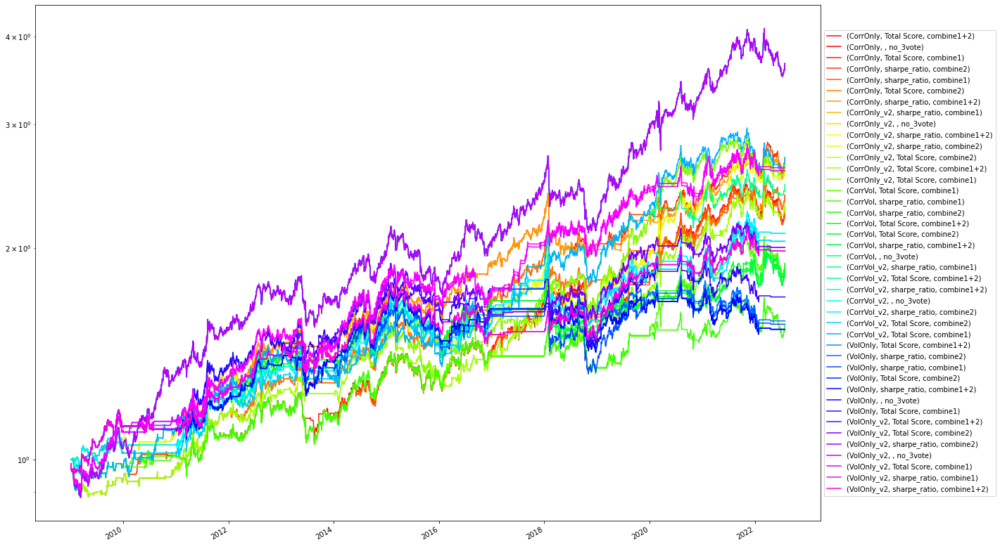

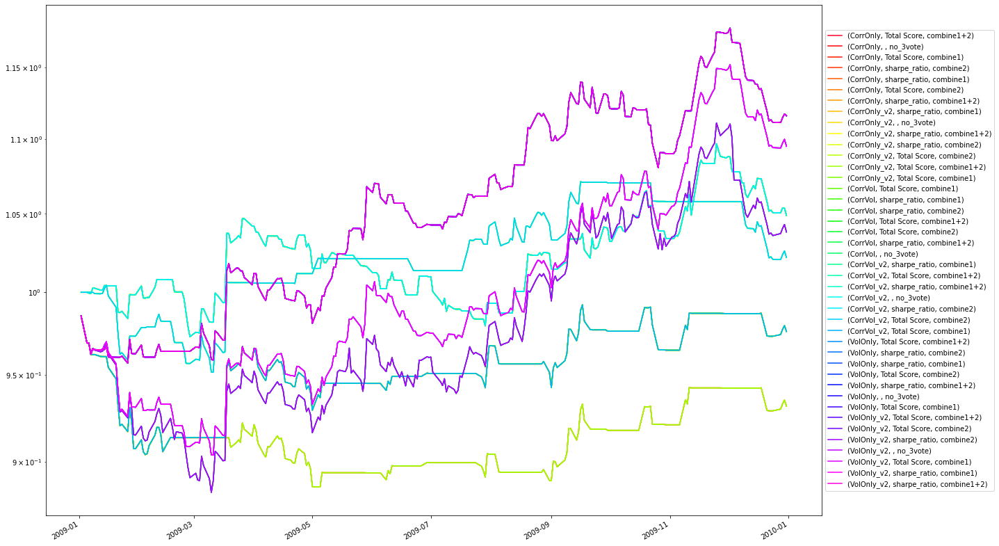

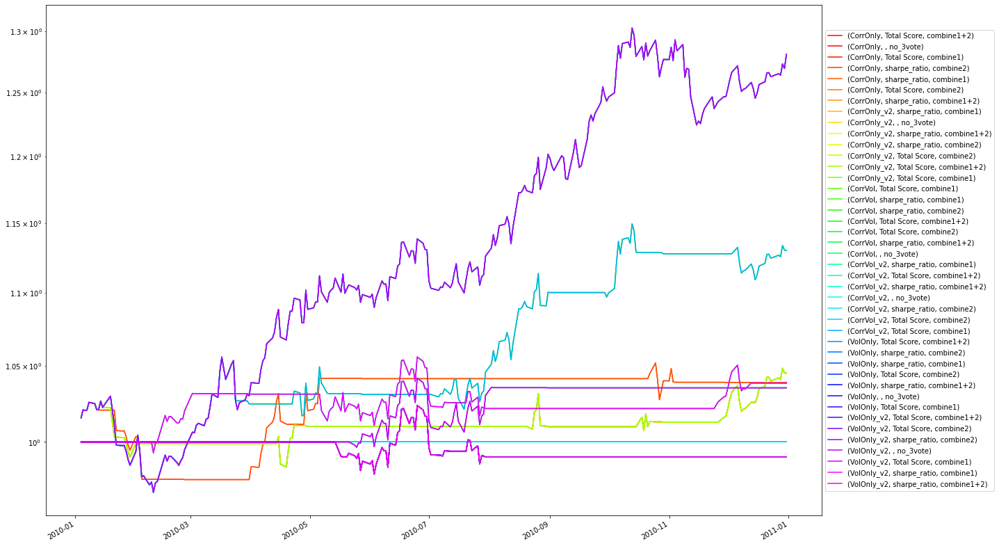

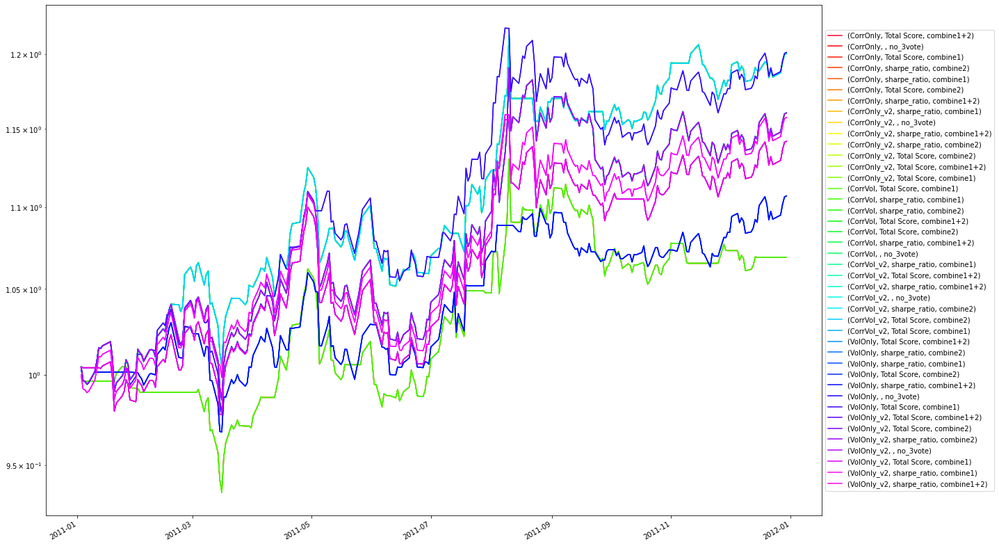

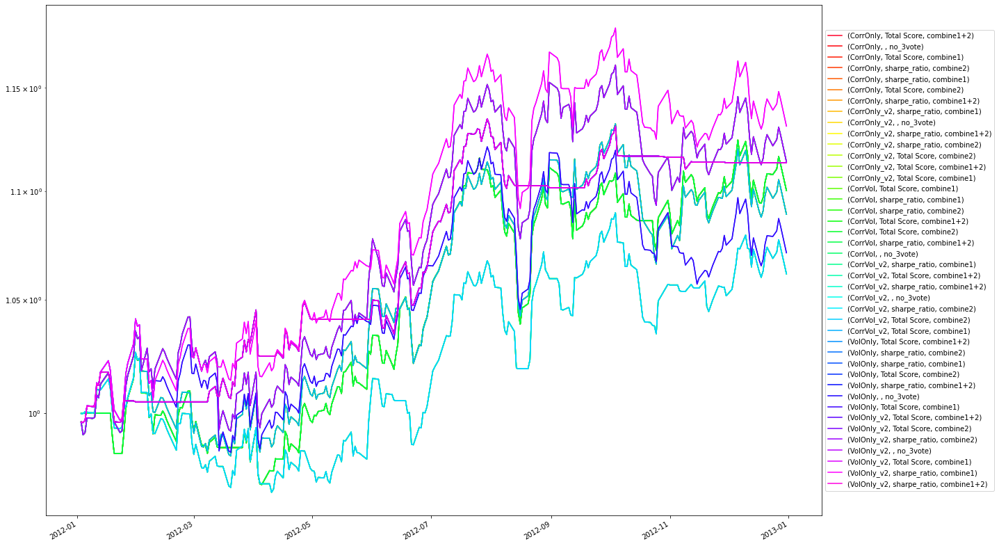

...

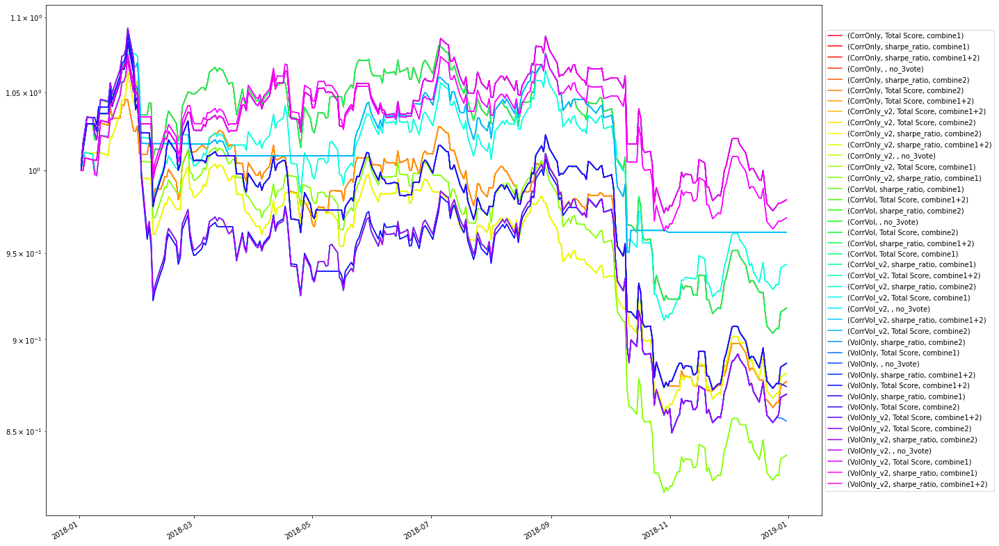

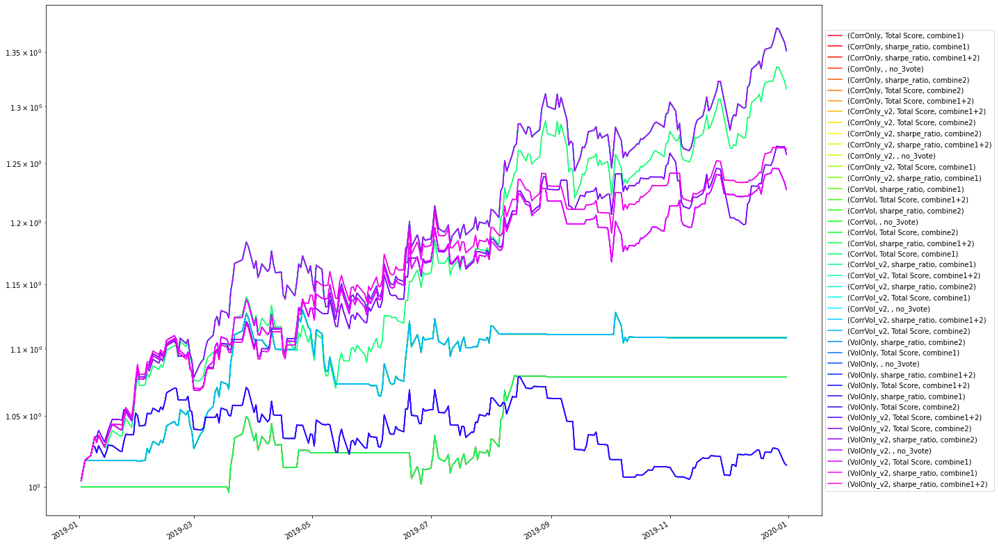

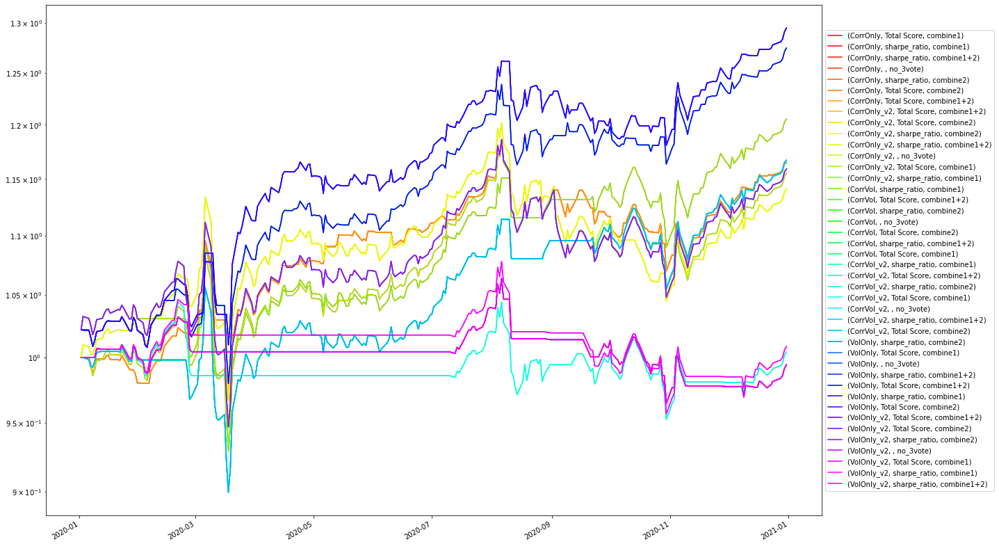

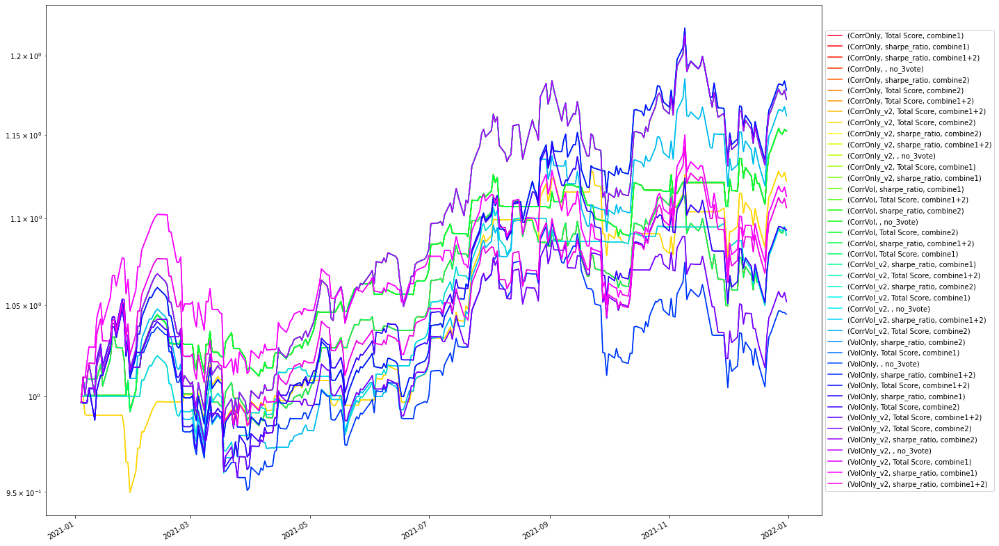

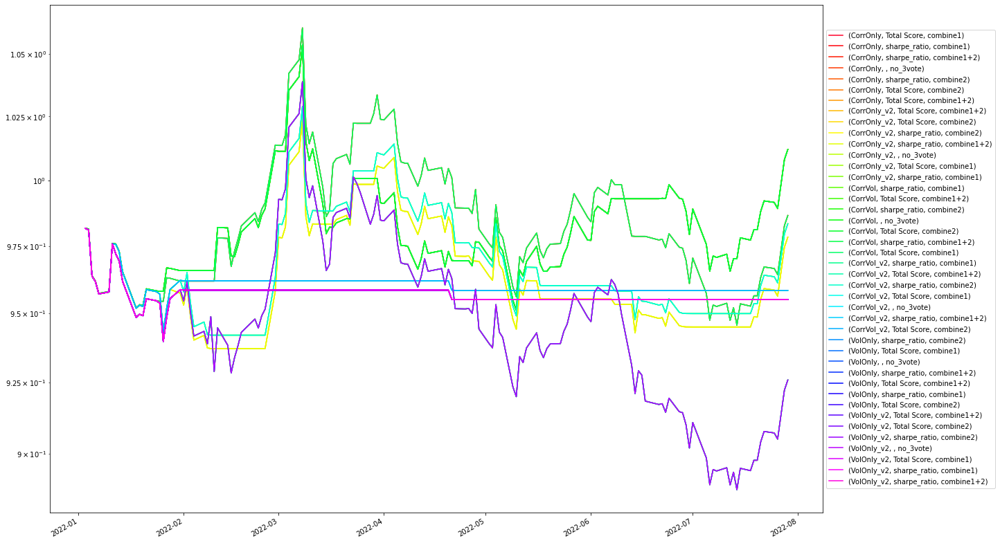

In [58]:
# show_ret = pd.concat([base_case_ret, all_ret_df[show_df.index[:10]]], axis=1)
show_ret = all_ret_df.dropna()
for c in ['FixCorrAsset_13ETFs', 'withAssetSliding_13ETFs']:
    show_cum_ret(show_ret[c])
    for yy in range(show_ret.index[0].year, show_ret.index[-1].year + 1):
        show_cum_ret(show_ret[c][str(yy)])

In [53]:
groupby_items = [
    'sliding_year', 'case_pool', 'case_metrics', 'case_combine',
    ['sliding_year', 'case_pool'], ['sliding_year', 'case_combine']
]

all_met_df_count = all_met_df.loc[all_met_df.index.get_level_values('case_combine') != base_case_name, :]
show_df_count = show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
base_met_single_index = base_case_met.copy()
base_met_single_index.index = [base_case_name]


for gb in groupby_items:
    print("================================================== ", gb)
    ser1 = show_df_count.groupby(gb).count().mean(axis=1)
    ser2 = all_met_df_count.groupby(gb).count().mean(axis=1)
    ser3 = ser1 / ser2
    df = pd.concat([ser1.to_frame(), ser2.to_frame(), ser3.to_frame()], axis=1)
    df.columns = ['better', 'total', 'pct']
    display(df)

    perf = all_met_df_count.groupby(gb).mean()
    perf = pd.concat([base_met_single_index, perf])
    display(perf)

    perf_std = all_met_df_count.groupby(gb).std()
    display(perf_std)

==================================================  sliding_year


,better,total,pct
sliding_year,,,
performance1Y,2.0,18.0,0.111111
performance1YExclude1&2Y,3.0,18.0,0.166667
performanceSlidingYearExclude1&2Y,6.0,18.0,0.333333
performanceSlidingYear,NaN,18.0,NaN


,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
no_3vote,1.129764,0.082225,0.658750,0.133536,-0.222995,-0.063756,0.368729,1.289684,65.874973,104.111245,77.700450,2.589896,1.000000,0.000000
performance1Y,0.586430,0.048965,0.525936,0.100544,-0.213719,-0.070834,0.244800,0.824142,52.593572,102.448252,78.628118,1.805910,0.699947,0.094513
performance1YExclude1&2Y,0.614563,0.050797,0.511957,0.108238,-0.190072,-0.062972,0.270840,0.862255,51.195668,102.539856,80.992784,1.863408,0.818496,0.093674
performanceSlidingYear,0.619330,0.051236,0.539413,0.102083,-0.182605,-0.057967,0.284607,0.937427,53.941257,102.561779,81.739518,2.040217,0.726685,0.082875
performanceSlidingYearExclude1&2Y,0.776851,0.058913,0.569903,0.107418,-0.215610,-0.064153,0.273059,0.996827,56.990289,102.945640,78.439013,2.066029,0.785158,0.072039


,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
sliding_year,,,,,,,,,,,,,,
performance1Y,0.155935,0.010851,0.105406,0.005117,0.051020,0.026943,0.082528,0.403371,10.540557,0.542561,5.102024,0.723202,0.044045,0.016741
performance1YExclude1&2Y,0.176427,0.011933,0.107079,0.005843,0.014290,0.011249,0.076777,0.347016,10.707856,0.596643,1.429044,0.633878,0.042903,0.024158
performanceSlidingYear,0.155885,0.010663,0.091043,0.006512,0.024744,0.011062,0.068480,0.325968,9.104310,0.533166,2.474449,0.529332,0.081041,0.018770
performanceSlidingYearExclude1&2Y,0.476243,0.027453,0.193494,0.009043,0.014782,0.011263,0.123119,0.626765,19.349362,1.372627,1.478248,1.097986,0.064178,0.025612


==================================================  case_pool


,better,total,pct
case_pool,,,
CorrOnly,5.0,24.0,0.208333
CorrVol,4.0,24.0,0.166667
VolOnly,2.0,24.0,0.083333


,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
no_3vote,1.129764,0.082225,0.658750,0.133536,-0.222995,-0.063756,0.368729,1.289684,65.874973,104.111245,77.700450,2.589896,1.000000,0.000000
CorrOnly,0.774055,0.060294,0.593370,0.107891,-0.191367,-0.057869,0.314529,1.102639,59.336990,103.014717,80.863289,2.311486,0.790265,0.091833
CorrVol,0.650691,0.052916,0.551384,0.102600,-0.188239,-0.058036,0.282062,0.959579,55.138445,102.645809,81.176087,2.080307,0.725669,0.087511
VolOnly,0.523134,0.044222,0.465652,0.103222,-0.221898,-0.076040,0.208390,0.653271,46.565156,102.211120,77.810200,1.439880,0.756780,0.077982


,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
case_pool,,,,,,,,,,,,,,
CorrOnly,0.340475,0.018695,0.141041,0.006463,0.022515,0.012087,0.081366,0.465571,14.104116,0.934727,2.251512,0.765847,0.055613,0.024792
CorrVol,0.234496,0.014621,0.116842,0.007432,0.016940,0.009284,0.071902,0.366365,11.684190,0.731058,1.693950,0.651370,0.091820,0.018276
VolOnly,0.200722,0.013435,0.097654,0.007504,0.042715,0.020501,0.082225,0.362161,9.765440,0.671770,4.271549,0.619958,0.061945,0.024355


==================================================  case_metrics


,better,total,pct
case_metrics,,,
Total Score,7.0,36.0,0.194444
sharpe_ratio,4.0,36.0,0.111111


,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
no_3vote,1.129764,0.082225,0.658750,0.133536,-0.222995,-0.063756,0.368729,1.289684,65.874973,104.111245,77.700450,2.589896,1.000000,0.000000
Total Score,0.674712,0.054153,0.551199,0.104761,-0.199977,-0.063193,0.277328,0.942993,55.119873,102.707635,80.002310,2.026873,0.760232,0.085432
sharpe_ratio,0.623875,0.050803,0.522405,0.104381,-0.201026,-0.064771,0.259326,0.867333,52.240520,102.540129,79.897407,1.860909,0.754911,0.086119


,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
case_metrics,,,,,,,,,,,,,,
Total Score,0.288824,0.017081,0.130323,0.007639,0.033022,0.016723,0.089836,0.446481,13.032265,0.854067,3.302215,0.770854,0.075776,0.023252
sharpe_ratio,0.275008,0.016733,0.129273,0.007334,0.033226,0.017247,0.089500,0.432232,12.927265,0.836634,3.322563,0.766839,0.075953,0.023262


==================================================  case_combine


,better,total,pct
case_combine,,,
combine1,6.0,24.0,0.250000
combine1+2,2.0,24.0,0.083333
combine2,3.0,24.0,0.125000


,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
no_3vote,1.129764,0.082225,0.658750,0.133536,-0.222995,-0.063756,0.368729,1.289684,65.874973,104.111245,77.700450,2.589896,1.000000,0.000000
combine1,0.816993,0.062661,0.591892,0.112149,-0.205164,-0.061831,0.308853,1.087075,59.189187,103.133045,79.483648,2.246946,0.812264,0.061241
combine1+2,0.561317,0.047132,0.507047,0.100754,-0.198170,-0.065110,0.246665,0.808307,50.704686,102.356595,80.182964,1.780042,0.729817,0.098014
combine2,0.569570,0.047640,0.511467,0.100809,-0.198170,-0.065005,0.249463,0.820106,51.146718,102.382006,80.182964,1.804685,0.730633,0.098071


,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
case_combine,,,,,,,,,,,,,,
combine1,0.372876,0.020679,0.147706,0.007123,0.039362,0.014764,0.090456,0.505171,14.770601,1.033943,3.936208,0.809784,0.075406,0.017148
combine1+2,0.168493,0.011653,0.109611,0.003870,0.029638,0.018168,0.081505,0.369364,10.961105,0.582634,2.963764,0.698974,0.059705,0.014268
combine2,0.180479,0.012369,0.115466,0.003894,0.029638,0.018025,0.085581,0.385531,11.546576,0.618462,2.963764,0.729561,0.060048,0.014380


==================================================  ['sliding_year', 'case_pool']


better  total       pct
sliding_year                      case_pool                         
performance1Y                     CorrVol       2.0    6.0  0.333333
performance1YExclude1&2Y          CorrOnly      3.0    6.0  0.500000
performanceSlidingYearExclude1&2Y CorrOnly      2.0    6.0  0.333333
                                  CorrVol       2.0    6.0  0.333333
                                  VolOnly       2.0    6.0  0.333333
performance1Y                     CorrOnly      NaN    6.0       NaN
                                  VolOnly       NaN    6.0       NaN
performance1YExclude1&2Y          CorrVol       NaN    6.0       NaN
                                  VolOnly       NaN    6.0       NaN
performanceSlidingYear            CorrOnly      NaN    6.0       NaN
                                  CorrVol       NaN    6.0       NaN
                                  VolOnly       NaN    6.0       NaN

,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
no_3vote,1.129764,0.082225,0.658750,0.133536,-0.222995,-0.063756,0.368729,1.289684,65.874973,104.111245,77.700450,2.589896,1.000000,0.000000
"(performance1Y, CorrOnly)",0.614983,0.051192,0.532153,0.104866,-0.171067,-0.051968,0.298352,1.013672,53.215343,102.559597,82.893262,2.061390,0.749113,0.103938
"(performance1Y, CorrVol)",0.690041,0.056066,0.604491,0.098341,-0.188266,-0.053579,0.296376,1.086017,60.449069,102.803308,81.173440,2.361456,0.652592,0.091346
"(performance1Y, VolOnly)",0.454265,0.039637,0.441163,0.098424,-0.281823,-0.106956,0.139672,0.372736,44.116304,101.981852,71.817653,0.994883,0.698135,0.088255
"(performance1YExclude1&2Y, CorrOnly)",0.761246,0.060570,0.606242,0.107358,-0.176144,-0.051563,0.344490,1.195417,60.624176,103.028485,82.385599,2.453337,0.796144,0.100733
"(performance1YExclude1&2Y, CorrVol)",0.585429,0.049135,0.496351,0.107936,-0.189520,-0.062553,0.261153,0.808901,49.635089,102.456764,81.047983,1.779830,0.833219,0.096383
"(performance1YExclude1&2Y, VolOnly)",0.497015,0.042686,0.433277,0.109420,-0.204552,-0.074800,0.206878,0.582447,43.327739,102.134318,79.544771,1.357057,0.826124,0.083906
"(performanceSlidingYear, CorrOnly)",0.695191,0.056271,0.558710,0.107965,-0.206599,-0.060218,0.271993,0.944400,55.870950,102.813543,79.340133,2.041908,0.786188,0.094208
"(performanceSlidingYear, CorrVol)",0.636771,0.052742,0.576887,0.097800,-0.169807,-0.052158,0.314927,1.061517,57.688677,102.637117,83.019346,2.299113,0.649045,0.086538
"(performanceSlidingYear, VolOnly)",0.526029,0.044694,0.482641,0.100485,-0.171409,-0.061526,0.266902,0.806363,48.264146,102.234677,82.859076,1.779629,0.744822,0.067880


total_return  annual_return  \
sliding_year                      case_pool                                
performance1Y                     CorrOnly       0.106296       0.007406   
                                  CorrVol        0.146447       0.009658   
                                  VolOnly        0.122907       0.009018   
performance1YExclude1&2Y          CorrOnly       0.164380       0.010674   
                                  CorrVol        0.115831       0.007862   
                                  VolOnly        0.148235       0.010561   
performanceSlidingYear            CorrOnly       0.172769       0.011564   
                                  CorrVol        0.082836       0.005637   
                                  VolOnly        0.167906       0.011688   
performanceSlidingYearExclude1&2Y CorrOnly       0.592963       0.031433   
                                  CorrVol        0.449573       0.027688   
                                  VolOnly        0.321498       0.020838   

                                             sharpe_ratio  annual_volatility  \
sliding_year                      case_pool                                    
performance1Y                     CorrOnly       0.085680           0.005284   
                                  CorrVol        0.098209           0.001028   
                                  VolOnly        0.068657           0.005138   
performance1YExclude1&2Y          CorrOnly       0.114757           0.006451   
                                  CorrVol        0.047508           0.005699   
                                  VolOnly        0.071897           0.006266   
performanceSlidingYear            CorrOnly       0.086181           0.007232   
                                  CorrVol        0.072170           0.003948   
                                  VolOnly        0.097708           0.003115   
performanceSlidingYearExclude1&2Y CorrOnly       0.221728           0.006663   
                                  CorrVol        0.192932           0.010234   
                                  VolOnly        0.142148           0.009942   

                                             max_drawdown  avg_drawdown  \
sliding_year                      case_pool                               
performance1Y                     CorrOnly       0.005494      0.006996   
                                  CorrVol        0.009934      0.007746   
                                  VolOnly        0.013973      0.003013   
performance1YExclude1&2Y          CorrOnly       0.002371      0.004557   
                                  CorrVol        0.007990      0.007382   
                                  VolOnly        0.011837      0.005537   
performanceSlidingYear            CorrOnly       0.024936      0.007261   
                                  CorrVol        0.015492      0.010684   
                                  VolOnly        0.013497      0.013690   
performanceSlidingYearExclude1&2Y CorrOnly       0.011366      0.018354   
                                  CorrVol        0.012483      0.006117   
                                  VolOnly        0.008449      0.005358   

                                             return/maxdd  return/avgdd  \
sliding_year                      case_pool                               
performance1Y                     CorrOnly       0.034721      0.254974   
                                  CorrVol        0.038073      0.330279   
                                  VolOnly        0.024620      0.095876   
performance1YExclude1&2Y          CorrOnly       0.064102      0.291554   
                                  CorrVol        0.053928      0.238405   
                                  VolOnly        0.038644      0.192420   
performanceSlidingYear            CorrOnly       0.045808      0.219214   
                                  CorrVol        0.057879      0.296847   
                                  VolOnly        0.093945 

==================================================  ['sliding_year', 'case_combine']


better  total       pct
sliding_year                      case_combine                         
performance1Y                     combine1+2       1.0    6.0  0.166667
                                  combine2         1.0    6.0  0.166667
performance1YExclude1&2Y          combine1+2       1.0    6.0  0.166667
                                  combine2         2.0    6.0  0.333333
performanceSlidingYearExclude1&2Y combine1         6.0    6.0  1.000000
performance1Y                     combine1         NaN    6.0       NaN
performance1YExclude1&2Y          combine1         NaN    6.0       NaN
performanceSlidingYear            combine1         NaN    6.0       NaN
                                  combine1+2       NaN    6.0       NaN
                                  combine2         NaN    6.0       NaN
performanceSlidingYearExclude1&2Y combine1+2       NaN    6.0       NaN
                                  combine2         NaN    6.0       NaN

,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
no_3vote,1.129764,0.082225,0.658750,0.133536,-0.222995,-0.063756,0.368729,1.289684,65.874973,104.111245,77.700450,2.589896,1.000000,0.000000
"(performance1Y, combine1)",0.536102,0.045818,0.479416,0.105372,-0.213093,-0.075689,0.226515,0.630592,47.941601,102.290913,78.690723,1.560708,0.718847,0.076236
"(performance1Y, combine1+2)",0.609908,0.050408,0.547893,0.098125,-0.214032,-0.068618,0.253465,0.919078,54.789268,102.520415,78.596816,1.921346,0.690468,0.103709
"(performance1Y, combine2)",0.613279,0.050669,0.550498,0.098135,-0.214032,-0.068196,0.254420,0.922756,55.049847,102.533429,78.596816,1.935676,0.690525,0.103594
"(performance1YExclude1&2Y, combine1)",0.666865,0.054727,0.516763,0.116119,-0.192747,-0.059386,0.286106,0.932699,51.676299,102.736372,80.725252,1.893715,0.868349,0.062729
"(performance1YExclude1&2Y, combine1+2)",0.573593,0.047946,0.502016,0.104192,-0.188734,-0.064764,0.258088,0.805273,50.201579,102.397283,81.126550,1.806135,0.791967,0.108974
"(performance1YExclude1&2Y, combine2)",0.603231,0.049718,0.517091,0.104403,-0.188734,-0.064766,0.268327,0.848793,51.709127,102.485912,81.126550,1.890375,0.795171,0.109318
"(performanceSlidingYear, combine1)",0.707647,0.057233,0.566842,0.108159,-0.194194,-0.059228,0.302137,1.010261,56.684154,102.861658,80.580568,2.149402,0.801179,0.066621
"(performanceSlidingYear, combine1+2)",0.575172,0.048237,0.525698,0.099046,-0.176810,-0.057337,0.275842,0.901010,52.569809,102.411839,82.318994,1.985624,0.689438,0.091003
"(performanceSlidingYear, combine2)",0.575172,0.048237,0.525698,0.099046,-0.176810,-0.057337,0.275842,0.901010,52.569809,102.411839,82.318994,1.985624,0.689438,0.091003


total_return  annual_return  \
sliding_year                      case_combine                                
performance1Y                     combine1          0.063177       0.004488   
                                  combine1+2        0.194686       0.013627   
                                  combine2          0.190298       0.013290   
performance1YExclude1&2Y          combine1          0.091003       0.006230   
                                  combine1+2        0.191276       0.012952   
                                  combine2          0.235607       0.015744   
performanceSlidingYear            combine1          0.141892       0.009335   
                                  combine1+2        0.155640       0.010833   
                                  combine2          0.155640       0.010833   
performanceSlidingYearExclude1&2Y combine1          0.347408       0.016581   
                                  combine1+2        0.148106       0.010309   
                                  combine2          0.148106       0.010309   

                                                sharpe_ratio  \
sliding_year                      case_combine                 
performance1Y                     combine1          0.048964   
                                  combine1+2        0.127065   
                                  combine2          0.123825   
performance1YExclude1&2Y          combine1          0.049655   
                                  combine1+2        0.121914   
                                  combine2          0.146551   
performanceSlidingYear            combine1          0.062499   
                                  combine1+2        0.107055   
                                  combine2          0.107055   
performanceSlidingYearExclude1&2Y combine1          0.120895   
                                  combine1+2        0.082388   
                                  combine2          0.082388   

                                                annual_volatility  \
sliding_year                      case_combine                      
performance1Y                     combine1               0.005511   
                                  combine1+2             0.002894   
                                  combine2               0.002882   
performance1YExclude1&2Y          combine1               0.001409   
                                  combine1+2             0.001234   
                                  combine2               0.000849   
performanceSlidingYear            combine1               0.007114   
                                  combine1+2             0.003684   
                                  combine2               0.003684   
performanceSlidingYearExclude1&2Y combine1               0.001351   
                                  combine1+2             0.004299   
                                  combine2               0.004299   

                                                max_drawdown  avg_drawdown  \
sliding_year                      case_combine                               
performance1Y                     combine1          0.067407      0.021446   
                                  combine1+2        0.046400      0.031676   
                                  combine2          0.046400      0.031022   
performance1YExclude1&2Y          combine1          0.020981      0.006746   
                                  combine1+2        0.010983      0.013058   
                                  combine2          0.010983      0.013822   
performanceSlidingYear            combine1          0.038078      0.011965   
                                  combine1+2        0.013965      0.011620   
                                  combine2          0.013965      0.011620   
performanceSlidingYearExclude1&2Y combine1          0.001333      0.003898   
                                  combine1+2        0.018655      0.009826   
                                  combine2          0.018655   

# Sliding with correlate asset and threshold

In [59]:
base_folder = './result/2022/cashON_signal/result/yearly_threshold/sliding_withAsset_13ETFs/'
sliding_case_name = 'sliding_withAsset_13ETFs'

start = '2008'
end = '2022'

In [60]:
all_ret = {}
all_met = {}
for f in os.listdir(base_folder):
    try:
        case_folder = os.path.join(base_folder, f)
        
        case_type2 = f.split('_')
        if len(case_type2) > 2:
            case_type2 = [case_type2[0], "_".join(case_type2[1:])]
        print(case_type2)

        ret = pd.read_csv(os.path.join(case_folder, 'final_ret.csv'), index_col=0)
        names = ['case_metrics', 'case_combine']
        ret.columns = pd.MultiIndex.from_tuples([idx.rsplit("_", 1) if idx != "no_3vote" else ["", "no_3vote"] for idx in ret.columns], names=names)
        ret.index = pd.to_datetime(ret.index)
        all_ret[tuple(case_type2)] = ret
        met = pd.read_csv(os.path.join(case_folder, 'final_metrics.csv'), index_col=0)
        names = ['case_metrics', 'case_combine']
        met.index = pd.MultiIndex.from_tuples([idx.rsplit("_", 1) if idx != "no_3vote" else ["", "no_3vote"] for idx in met.index], names=names)
        all_met[tuple(case_type2)] = met
    except:
        print("Failed for {}".format(f))
    # break
all_ret_df = pd.concat(all_ret.values(), keys=all_ret.keys(), axis=1)
# all_met_df = pd.concat(all_met.values(), keys=all_met.keys())

['sliding1Y', 'CorrOnly']
['sliding1Y', 'CorrVol']
['sliding1Y', 'VolOnly']
['sliding2Y', 'CorrOnly']
['sliding2Y', 'CorrVol']
['sliding2Y', 'VolOnly']
['sliding3Y', 'CorrOnly']
['sliding3Y', 'CorrVol']
['sliding3Y', 'VolOnly']
['sliding4Y', 'CorrOnly']
['sliding4Y', 'CorrVol']
['sliding4Y', 'VolOnly']
['sliding5Y', 'CorrOnly']
['sliding5Y', 'CorrVol']
['sliding5Y', 'VolOnly']


In [61]:
# 13ETFs	v1	sliding1Y	2thresholds	combine2	no_3vote
idx_names = ['sliding_year', 'case_pool', 'case_metrics', 'case_combine']
all_ret_df.columns.names = idx_names
# all_met_df.index.names = idx_names
all_ret_df_dict[sliding_case_name] = all_ret_df
all_ret_df.dropna()

sliding_year    sliding1Y                                                 \
case_pool        CorrOnly                                                  
case_metrics sharpe_ratio Total Score sharpe_ratio Total Score             
case_combine   combine1+2  combine1+2     combine1    combine2  no_3vote   
2013-01-02       0.005281    0.005281     0.005281    0.005281  0.005281   
2013-01-03      -0.025686   -0.025686    -0.025686   -0.025686 -0.025686   
2013-01-04      -0.000303   -0.000303     0.005259   -0.000303  0.005259   
2013-01-07       0.000000    0.000000     0.000121    0.000000  0.000121   
2013-01-08       0.001322    0.001322     0.001625    0.001322  0.001625   
...                   ...         ...          ...         ...       ...   
2022-07-25      -0.000582   -0.000582    -0.000582   -0.000582 -0.000582   
2022-07-26      -0.002362   -0.002362    -0.002362   -0.002362 -0.002362   
2022-07-27       0.009400    0.009400     0.009400    0.009400  0.009400   
2022-07-28       0.009597    0.009597     0.009597    0.009597  0.009597   
2022-07-29       0.003909    0.003909     0.003909    0.003909  0.003906   

sliding_year                                                              ...  \
case_pool                               CorrVol                           ...   
case_metrics sharpe_ratio Total Score           sharpe_ratio Total Score  ...   
case_combine     combine2    combine1  no_3vote     combine1    combine2  ...   
2013-01-02       0.005281    0.005281  0.005281     0.005281    0.004980  ...   
2013-01-03      -0.025686   -0.025686 -0.025686    -0.000304   -0.000304  ...   
2013-01-04      -0.000303    0.005259  0.005259     0.000000    0.000000  ...   
2013-01-07       0.000000    0.000121  0.000121     0.000000    0.000000  ...   
2013-01-08       0.001322    0.001625  0.001625     0.000000    0.000000  ...   
...                   ...         ...       ...          ...         ...  ...   
2022-07-25      -0.000582   -0.000582 -0.000582    -0.000582    0.000000  ...   
2022-07-26      -0.002362   -0.002362 -0.002362    -0.002362    0.000000  ...   
2022-07-27       0.009400    0.009400  0.009400     0.009400    0.000000  ...   
2022-07-28       0.009597    0.009597  0.009597     0.009597    0.000000  ...   
2022-07-29       0.003909    0.003909  0.003906     0.003909    0.000000  ...   

sliding_year sliding5Y                                                   \
case_pool      CorrVol                             VolOnly                
case_metrics           sharpe_ratio            Total Score sharpe_ratio   
case_combine  no_3vote     combine1 combine1+2  combine1+2     combine2   
2013-01-02    0.005281     0.005281  -0.000299    0.000000     0.000000   
2013-01-03   -0.025686    -0.025686  -0.025982    0.000000     0.000000   
2013-01-04    0.005259     0.005259  -0.000303    0.000000     0.000000   
2013-01-07    0.000121     0.000121   0.000000    0.000000     0.000000   
2013-01-08    0.001625     0.001625   0.001322    0.000000     0.000000   
...                ...          ...        ...         ...          ...   
2022-07-25   -0.000582    -0.000582  -0.000582   -0.000582    -0.000582   
2022-07-26   -0.002362    -0.000100  -0.000100   -0.002362    -0.002362   
2022-07-27    0.009400     0.009299   0.009299    0.009400     0.009400   
2022-07-28    0.009597    -0.000101  -0.000101    0.009597     0.009597   
2022-07-29    0.003906     0.003801   0.003801    0.003906     0.003906   

sliding_year                                                            
case_pool                                                               
case_metrics           sharpe_ratio Total Score           sharpe_ratio  
case_combine  no_3vote   combine1+2    combine1  combine2     combine1  
2013-01-02    0.005281     0.000000    0.005281  0.000000     0.005281  
2013-01-03   -0.025686     0.000000   -0.000304  0.000000    -0.000304  
2013-01-04    0.005259     0.000000    0.004954  0.000000     0.004954  
2013-0

In [62]:
all_met_df = empy_metric(all_ret_df.dropna())
all_met_df = calculation_score(all_met_df)
all_met_df = pd.concat([all_met_df, other_metric(all_ret_df.dropna())], axis=1)
all_met_df_dict[sliding_case_name] = all_met_df
# all_met_df.head()

In [63]:
base_case_name = 'no_3vote'
base_case_ret = all_ret_df.loc[:, all_ret_df.columns.get_level_values('case_combine') == base_case_name].iloc[:, [0]]
base_case_ret.columns = pd.MultiIndex.from_tuples([("", "", "", base_case_name)], names=idx_names)
# display(base_case_ret)
base_case_met = all_met_df.loc[all_met_df.index.get_level_values('case_combine') == base_case_name, :].iloc[[0], :]
base_case_met.index = pd.MultiIndex.from_tuples([("", "", "", base_case_name)], names=idx_names)
base_case_met

,,,,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
sliding_year,case_pool,case_metrics,case_combine,,,,,,,,,,,,,,
,,,no_3vote,1.129764,0.082225,0.65875,0.133536,-0.222995,-0.063756,0.368729,1.289684,65.874973,104.111245,77.70045,2.589896,1.0,0.0


In [64]:
sort_by = 'sharpe_ratio'
sort_df = all_met_df.sort_values(sort_by, ascending=False)
show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
show_df = pd.concat([show_df, base_case_met])
show_df.head(20)

total_return  annual_return  \
sliding_year case_pool case_metrics case_combine                                
sliding5Y    VolOnly   Total Score  combine2          1.648139       0.107149   
                                    combine1+2        1.648139       0.107149   
sliding3Y    CorrOnly  sharpe_ratio combine1          1.556695       0.103090   
sliding5Y    VolOnly   sharpe_ratio combine1+2        1.241714       0.088035   
                                    combine2          1.241714       0.088035   
sliding3Y    CorrOnly  Total Score  combine1          1.425275       0.097023   
sliding5Y    VolOnly   Total Score  combine1          1.318378       0.091866   
sliding3Y    CorrVol   sharpe_ratio combine1          1.290156       0.090469   
sliding5Y    VolOnly   sharpe_ratio combine1          1.286113       0.090268   
sliding3Y    VolOnly   sharpe_ratio combine1          1.263183       0.089120   
sliding2Y    VolOnly   Total Score  combine1          1.147153       0.083145   
sliding3Y    CorrVol   Total Score  combine1          1.169853       0.084336   
sliding2Y    VolOnly   sharpe_ratio combine1          1.100658       0.080669   
sliding4Y    CorrVol   sharpe_ratio combine1          1.181144       0.084925   
sliding3Y    VolOnly   Total Score  combine1          1.078138       0.079453   
sliding4Y    CorrOnly  Total Score  combine1+2        1.029086       0.076761   
                                    combine2          1.029086       0.076761   
sliding2Y    CorrVol   Total Score  combine1+2        0.956152       0.072649   
                                    combine2          0.956152       0.072649   
sliding1Y    CorrVol   sharpe_ratio combine1+2        0.782519       0.062278   

                                                  sharpe_ratio  \
sliding_year case_pool case_metrics case_combine                 
sliding5Y    VolOnly   Total Score  combine2          0.997558   
                                    combine1+2        0.997558   
sliding3Y    CorrOnly  sharpe_ratio combine1          0.888369   
sliding5Y    VolOnly   sharpe_ratio combine1+2        0.852727   
                                    combine2          0.852727   
sliding3Y    CorrOnly  Total Score  combine1          0.852565   
sliding5Y    VolOnly   Total Score  combine1          0.795702   
sliding3Y    CorrVol   sharpe_ratio combine1          0.790658   
sliding5Y    VolOnly   sharpe_ratio combine1          0.785163   
sliding3Y    VolOnly   sharpe_ratio combine1          0.784197   
sliding2Y    VolOnly   Total Score  combine1          0.769218   
sliding3Y    CorrVol   Total Score  combine1          0.760530   
sliding2Y    VolOnly   sharpe_ratio combine1          0.737926   
sliding4Y    CorrVol   sharpe_ratio combine1          0.734863   
sliding3Y    VolOnly   Total Score  combine1          0.708196   
sliding4Y    CorrOnly  Total Score  combine1+2        0.702677   
                                    combine2          0.702677   
sliding2Y    CorrVol   Total Score  combine1+2        0.682014   
                                    combine2          0.682014   
sliding1Y    CorrVol   sharpe_ratio combine1+2        0.678145   

                                                  annual_volatility  \
sliding_year case_pool case_metrics case_combine                      
sliding5Y    VolOnly   Total Score  combine2               0.107900   
                                    combine1+2             0.107900   
sliding3Y    CorrOnly  sharpe_ratio combine1               0.118362   
sliding5Y    VolOnly   sharpe_ratio combine1+2             0.105499   
                                    combine2               0.105499   
sliding3Y    CorrOnly  Total Score  combine1               0.116624   
sliding5Y    VolOnly   Total Score  combine1               0.119448   
sliding3Y    CorrVol   sharpe_ratio combine1               0.118445   
sliding5Y    VolOnly   sharpe_ratio combine1               0.119136   
sliding3Y    VolOnly   sharpe_rat

In [ ]:
groupby_items = [
    'sliding_year', 'case_pool', 'case_metrics', 'case_combine',
    ['sliding_year', 'case_pool'], ['sliding_year', 'case_combine']
]

all_met_df_count = all_met_df.loc[all_met_df.index.get_level_values('case_combine') != base_case_name, :]
show_df_count = show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
base_met_single_index = base_case_met.copy()
base_met_single_index.index = [base_case_name]


for gb in groupby_items:
    print("================================================== ", gb)
    ser1 = show_df_count.groupby(gb).count().mean(axis=1)
    ser2 = all_met_df_count.groupby(gb).count().mean(axis=1)
    ser3 = ser1 / ser2
    df = pd.concat([ser1.to_frame(), ser2.to_frame(), ser3.to_frame()], axis=1)
    df.columns = ['better', 'total', 'pct']
    display(df)

    perf = all_met_df_count.groupby(gb).mean()
    perf = pd.concat([base_met_single_index, perf])
    display(perf)

    perf_std = all_met_df_count.groupby(gb).std()
    display(perf_std)

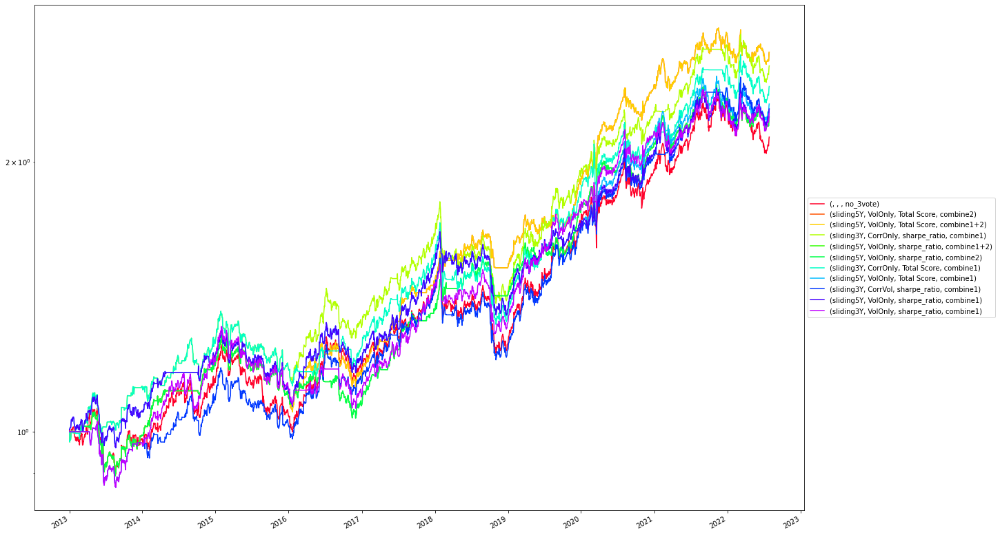

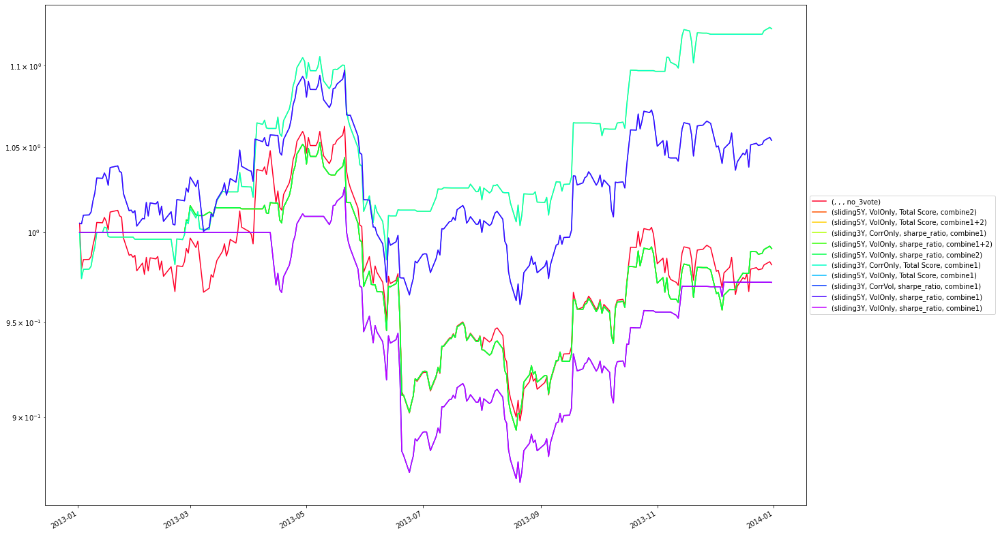

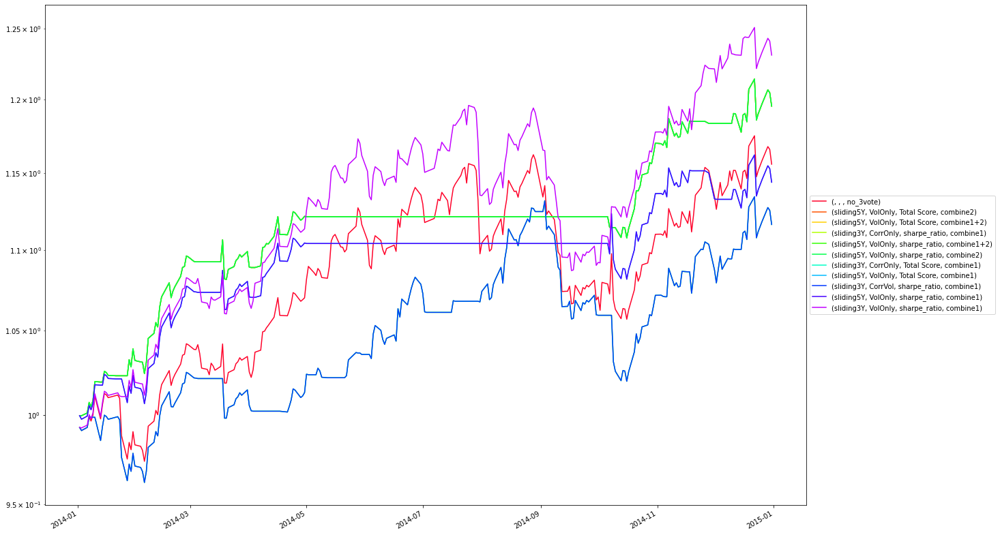

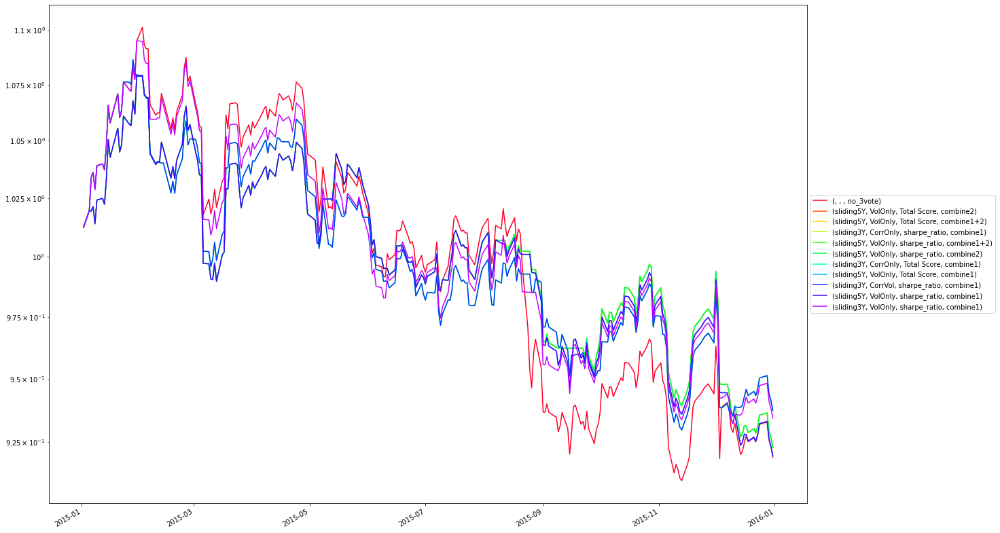

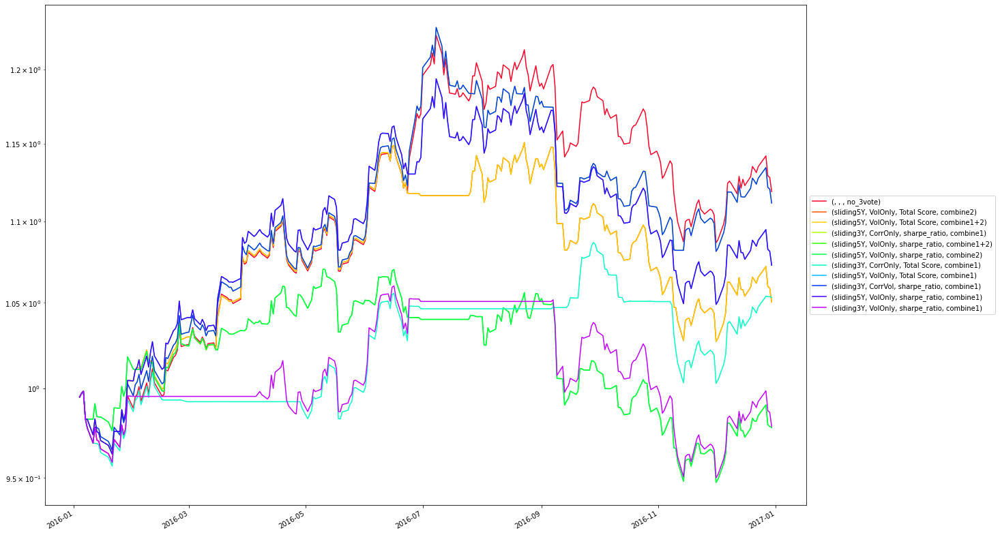

...

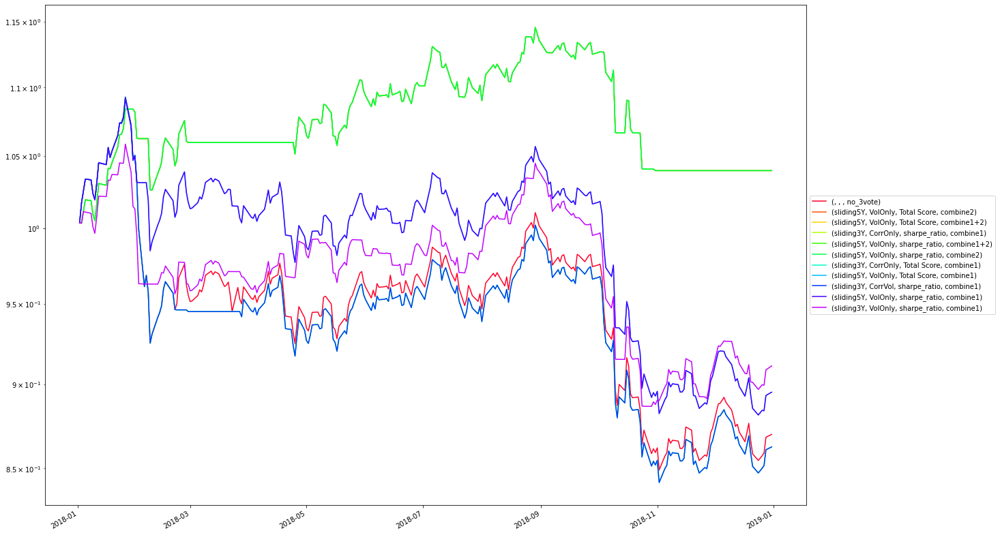

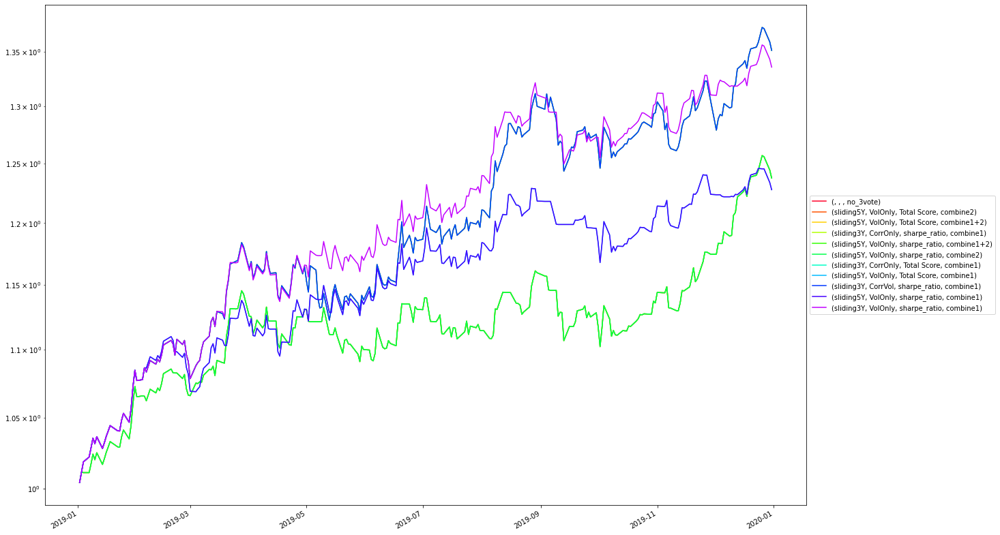

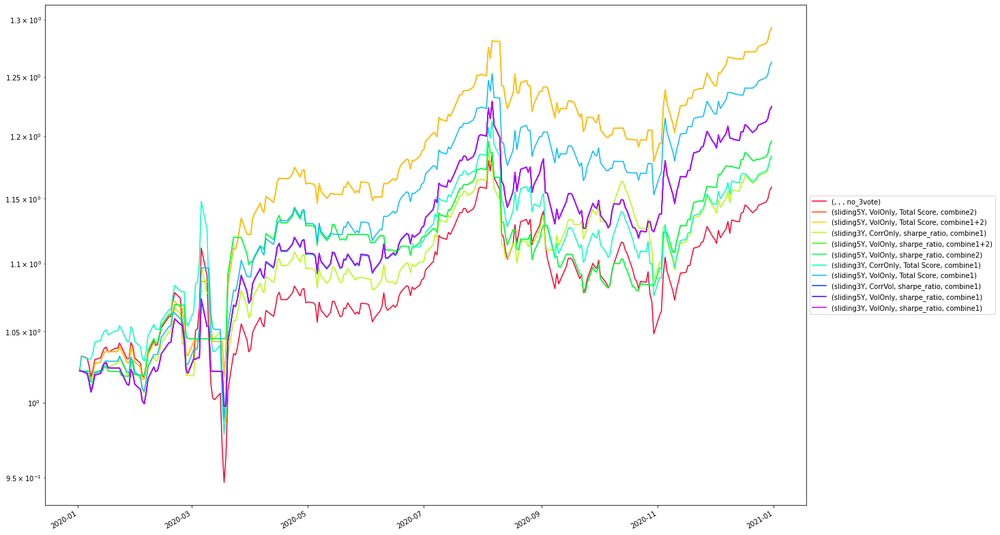

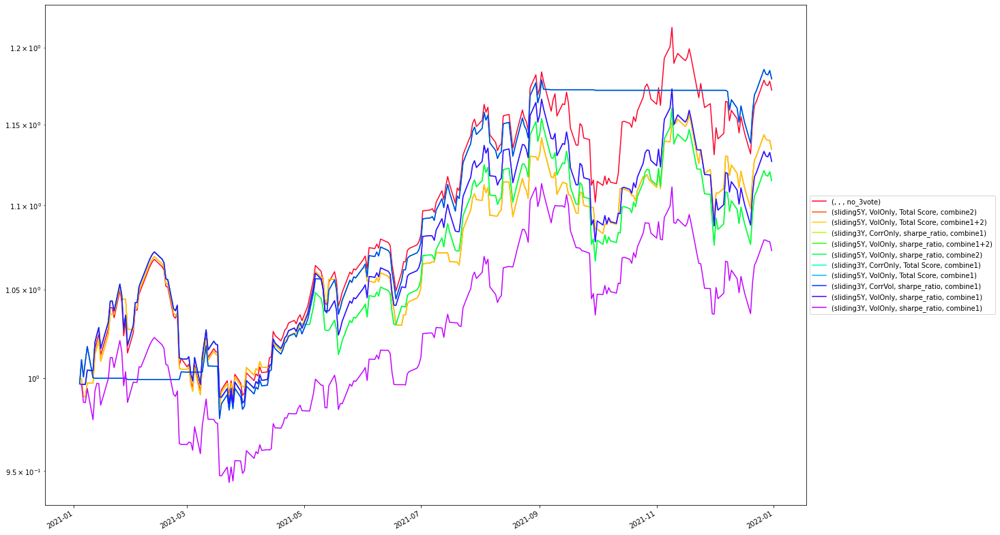

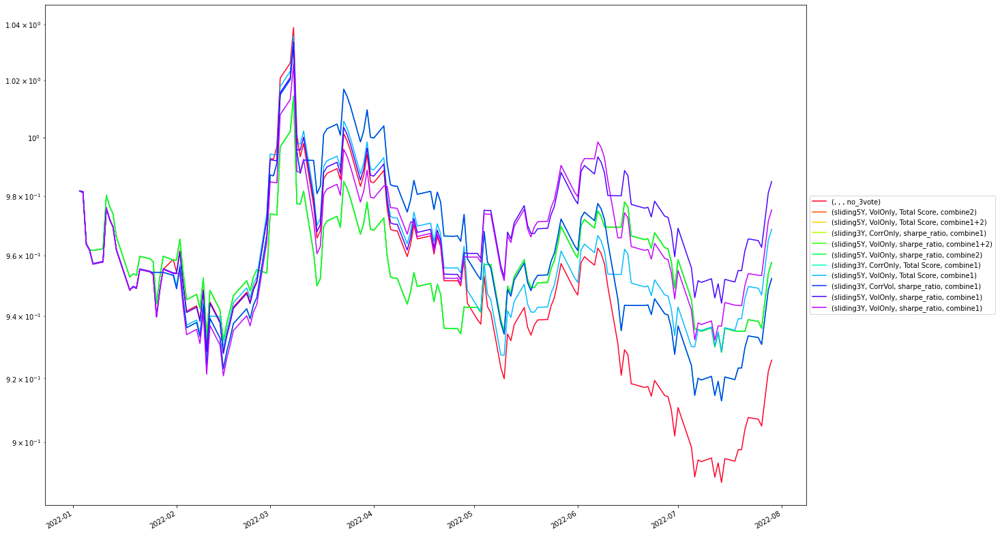

In [65]:
show_ret = pd.concat([base_case_ret, all_ret_df[show_df.index[:10]]], axis=1)
show_ret = show_ret.dropna()
show_cum_ret(show_ret)
for yy in range(show_ret.index[0].year, show_ret.index[-1].year + 1):
    show_cum_ret(show_ret[str(yy)])

# Sliding with 3 correlate_assets and threshold

In [7]:
base_folder = './result/2022/cashON_signal/result/yearly_threshold/sliding_FixCorrAsset_13ETFs/'
sliding_case_name = 'sliding_FixCorrAsset_13ETFs'

start = '2008'
end = '2022'

In [8]:
all_ret = {}
all_met = {}
for f in os.listdir(base_folder):
    try:
        case_folder = os.path.join(base_folder, f)
        
        case_type2 = f.split('_')
        if len(case_type2) > 2:
            case_type2 = [case_type2[0], "_".join(case_type2[1:])]
        print(case_type2)

        ret = pd.read_csv(os.path.join(case_folder, 'final_ret.csv'), index_col=0)
        names = ['case_metrics', 'case_combine']
        ret.columns = pd.MultiIndex.from_tuples([idx.rsplit("_", 1) if idx != "no_3vote" else ["", "no_3vote"] for idx in ret.columns], names=names)
        ret.index = pd.to_datetime(ret.index)
        all_ret[tuple(case_type2)] = ret
        met = pd.read_csv(os.path.join(case_folder, 'final_metrics.csv'), index_col=0)
        names = ['case_metrics', 'case_combine']
        met.index = pd.MultiIndex.from_tuples([idx.rsplit("_", 1) if idx != "no_3vote" else ["", "no_3vote"] for idx in met.index], names=names)
        all_met[tuple(case_type2)] = met
    except:
        print("Failed for {}".format(f))
    # break
all_ret_df = pd.concat(all_ret.values(), keys=all_ret.keys(), axis=1)
# all_met_df = pd.concat(all_met.values(), keys=all_met.keys())

['sliding1Y', 'CorrOnly']
['sliding1Y', 'CorrVol']
['sliding1Y', 'VolOnly']
['sliding2Y', 'CorrOnly']
['sliding2Y', 'CorrVol']
['sliding2Y', 'VolOnly']
['sliding3Y', 'CorrOnly']
['sliding3Y', 'CorrVol']
['sliding3Y', 'VolOnly']
['sliding4Y', 'CorrOnly']
['sliding4Y', 'CorrVol']
['sliding4Y', 'VolOnly']
['sliding5Y', 'CorrOnly']
['sliding5Y', 'CorrVol']
['sliding5Y', 'VolOnly']


In [9]:
# 13ETFs	v1	sliding1Y	2thresholds	combine2	no_3vote
idx_names = ['sliding_year', 'case_pool', 'case_metrics', 'case_combine']
all_ret_df.columns.names = idx_names
# all_met_df.index.names = idx_names
all_ret_df_dict[sliding_case_name] = all_ret_df
all_ret_df

sliding_year sliding1Y                                                    \
case_pool     CorrOnly                                                     
case_metrics           Total Score sharpe_ratio Total Score sharpe_ratio   
case_combine  no_3vote    combine1     combine2    combine2   combine1+2   
2009-01-02   -0.014656   -0.014656     0.000000   -0.014755     0.000000   
2009-01-05   -0.016480   -0.016480     0.000000   -0.016480     0.000000   
2009-01-06   -0.000473   -0.000473    -0.000573   -0.000473    -0.000573   
2009-01-07   -0.006681   -0.006681    -0.000100   -0.006681    -0.000100   
2009-01-08    0.003415   -0.000100     0.003315   -0.000100     0.003315   
...                ...         ...          ...         ...          ...   
2022-08-24         NaN         NaN          NaN         NaN          NaN   
2022-08-25         NaN         NaN          NaN         NaN          NaN   
2022-08-26         NaN         NaN          NaN         NaN          NaN   
2022-08-29         NaN         NaN          NaN         NaN          NaN   
2022-08-30         NaN         NaN          NaN         NaN          NaN   

sliding_year                                                         ...  \
case_pool                            CorrVol                         ...   
case_metrics           Total Score           sharpe_ratio            ...   
case_combine  combine1  combine1+2  no_3vote     combine1  combine2  ...   
2009-01-02   -0.014656   -0.014755 -0.014656    -0.014656  0.000000  ...   
2009-01-05   -0.016480   -0.016480 -0.016480    -0.016480  0.000000  ...   
2009-01-06   -0.000473   -0.000473 -0.000473    -0.000473 -0.000573  ...   
2009-01-07   -0.006681   -0.006681 -0.006681    -0.006681 -0.000100  ...   
2009-01-08   -0.000100   -0.000100  0.003415    -0.000100  0.003315  ...   
...                ...         ...       ...          ...       ...  ...   
2022-08-24         NaN         NaN       NaN          NaN       NaN  ...   
2022-08-25         NaN         NaN       NaN          NaN       NaN  ...   
2022-08-26         NaN         NaN       NaN          NaN       NaN  ...   
2022-08-29         NaN         NaN       NaN          NaN       NaN  ...   
2022-08-30         NaN         NaN       NaN          NaN       NaN  ...   

sliding_year sliding5Y                                                    \
case_pool      CorrVol                              VolOnly                
case_metrics           Total Score sharpe_ratio Total Score sharpe_ratio   
case_combine  no_3vote    combine2   combine1+2    combine2     combine2   
2009-01-02         NaN         NaN          NaN         NaN          NaN   
2009-01-05         NaN         NaN          NaN         NaN          NaN   
2009-01-06         NaN         NaN          NaN         NaN          NaN   
2009-01-07         NaN         NaN          NaN         NaN          NaN   
2009-01-08         NaN         NaN          NaN         NaN          NaN   
...                ...         ...          ...         ...          ...   
2022-08-24         NaN         NaN          NaN         NaN          NaN   
2022-08-25         NaN         NaN          NaN         NaN          NaN   
2022-08-26         NaN         NaN          NaN         NaN          NaN   
2022-08-29         NaN         NaN          NaN         NaN          NaN   
2022-08-30         NaN         NaN          NaN         NaN          NaN   

sliding_year                                                             
case_pool                                                                
case_metrics Total Score          sharpe_ratio Total Score sharpe_ratio  
case_combine  combine1+2 no_3vote   combine1+2    combine1     combine1  
2009-01-02           NaN      NaN          NaN         NaN          NaN  
2009-01-05           NaN      NaN          NaN         NaN          NaN  
2009-01-06           NaN      NaN          NaN         NaN          NaN  
2009-01-07           NaN      NaN          NaN         NaN 

In [69]:
all_met_df = empy_metric(all_ret_df.dropna())
all_met_df = calculation_score(all_met_df)
all_met_df = pd.concat([all_met_df, other_metric(all_ret_df.dropna())], axis=1)
all_met_df_dict[sliding_case_name] = all_met_df
# all_met_df

In [70]:
base_case_name = 'no_3vote'
base_case_ret = all_ret_df.loc[:, all_ret_df.columns.get_level_values('case_combine') == base_case_name].iloc[:, [0]]
base_case_ret.columns = pd.MultiIndex.from_tuples([("", "", "", base_case_name)], names=idx_names)
# display(base_case_ret)
base_case_met = all_met_df.loc[all_met_df.index.get_level_values('case_combine') == base_case_name, :].iloc[[0], :]
base_case_met.index = pd.MultiIndex.from_tuples([("", "", "", base_case_name)], names=idx_names)
base_case_met

,,,,total_return,annual_return,sharpe_ratio,annual_volatility,max_drawdown,avg_drawdown,return/maxdd,return/avgdd,Sharpe Score,Return Score,Max-DD Score,Total Score,buy_ratio,flip_ratio
sliding_year,case_pool,case_metrics,case_combine,,,,,,,,,,,,,,
,,,no_3vote,1.129764,0.082225,0.65875,0.133536,-0.222995,-0.063756,0.368729,1.289684,65.874973,104.111245,77.70045,2.589896,1.0,0.0


In [71]:
sort_by = 'sharpe_ratio'
sort_df = all_met_df.sort_values(sort_by, ascending=False)
show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
# show_df = pd.concat([show_df, base_case_met])
show_df.head(20)

total_return  annual_return  \
sliding_year case_pool case_metrics case_combine                                
sliding2Y    CorrOnly  sharpe_ratio combine1          1.527653       0.101774   
                       Total Score  combine1          1.527653       0.101774   
sliding3Y    CorrVol   sharpe_ratio combine2          1.291663       0.090544   
                                    combine1+2        1.291663       0.090544   
sliding5Y    CorrVol   sharpe_ratio combine1          1.177251       0.084722   
sliding3Y    CorrVol   Total Score  combine1+2        1.043103       0.077536   
                                    combine2          1.043103       0.077536   
sliding2Y    CorrVol   Total Score  combine1          1.112594       0.081310   
                       sharpe_ratio combine1          1.112594       0.081310   
sliding4Y    CorrVol   sharpe_ratio combine1+2        1.034019       0.077034   
                                    combine2          1.034019       0.077034   
sliding5Y    CorrVol   Total Score  combine1          1.086994       0.079933   
             VolOnly   Total Score  combine1+2        1.007194       0.075541   
                                    combine2          1.007194       0.075541   
sliding4Y    CorrVol   Total Score  combine1          1.069596       0.078988   
                       sharpe_ratio combine1          1.069596       0.078988   
sliding3Y    VolOnly   Total Score  combine1+2        0.914350       0.070230   
                                    combine2          0.914350       0.070230   
sliding4Y    CorrVol   Total Score  combine1+2        0.938054       0.071608   
                                    combine2          0.938054       0.071608   

                                                  sharpe_ratio  \
sliding_year case_pool case_metrics case_combine                 
sliding2Y    CorrOnly  sharpe_ratio combine1          0.872701   
                       Total Score  combine1          0.872701   
sliding3Y    CorrVol   sharpe_ratio combine2          0.862886   
                                    combine1+2        0.862886   
sliding5Y    CorrVol   sharpe_ratio combine1          0.759486   
sliding3Y    CorrVol   Total Score  combine1+2        0.751513   
                                    combine2          0.751513   
sliding2Y    CorrVol   Total Score  combine1          0.727869   
                       sharpe_ratio combine1          0.727869   
sliding4Y    CorrVol   sharpe_ratio combine1+2        0.724718   
                                    combine2          0.724718   
sliding5Y    CorrVol   Total Score  combine1          0.718696   
             VolOnly   Total Score  combine1+2        0.714794   
                                    combine2          0.714794   
sliding4Y    CorrVol   Total Score  combine1          0.707557   
                       sharpe_ratio combine1          0.707557   
sliding3Y    VolOnly   Total Score  combine1+2        0.698055   
                                    combine2          0.698055   
sliding4Y    CorrVol   Total Score  combine1+2        0.685611   
                                    combine2          0.685611   

                                                  annual_volatility  \
sliding_year case_pool case_metrics case_combine                      
sliding2Y    CorrOnly  sharpe_ratio combine1               0.119236   
                       Total Score  combine1               0.119236   
sliding3Y    CorrVol   sharpe_ratio combine2               0.107119   
                                    combine1+2             0.107119   
sliding5Y    CorrVol   sharpe_ratio combine1               0.115958   
sliding3Y    CorrVol   Total Score  combine1+2             0.107010   
                                    combine2               0.107010   
sliding2Y    CorrVol   Total Score  combine1               0.116798   
                       sharpe_ratio combine1               0.116798   
sliding4Y    CorrVol   sharpe_rat

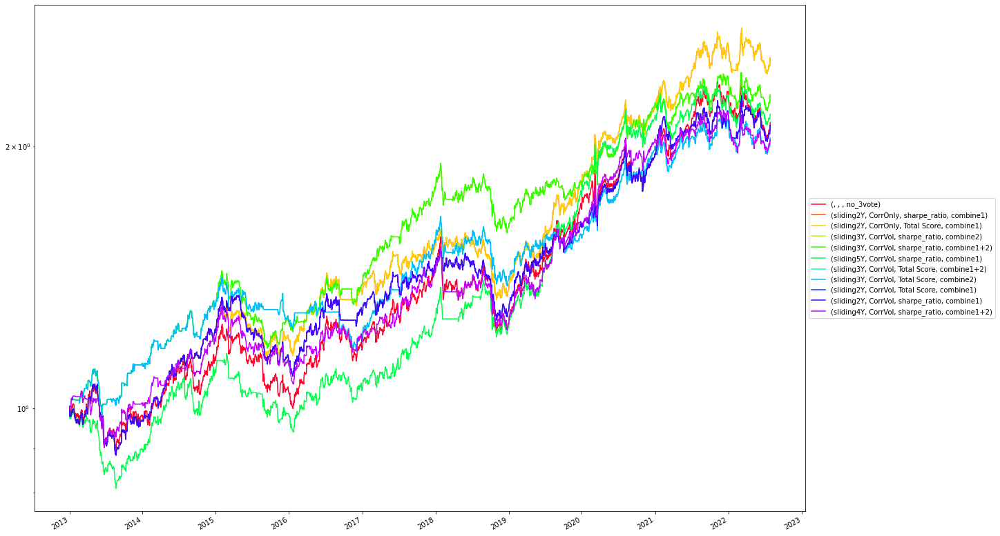

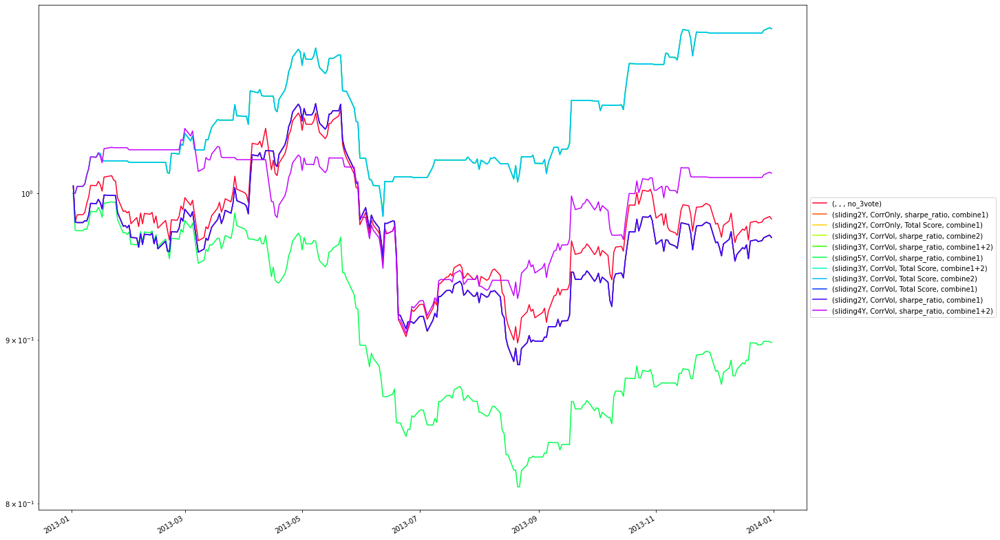

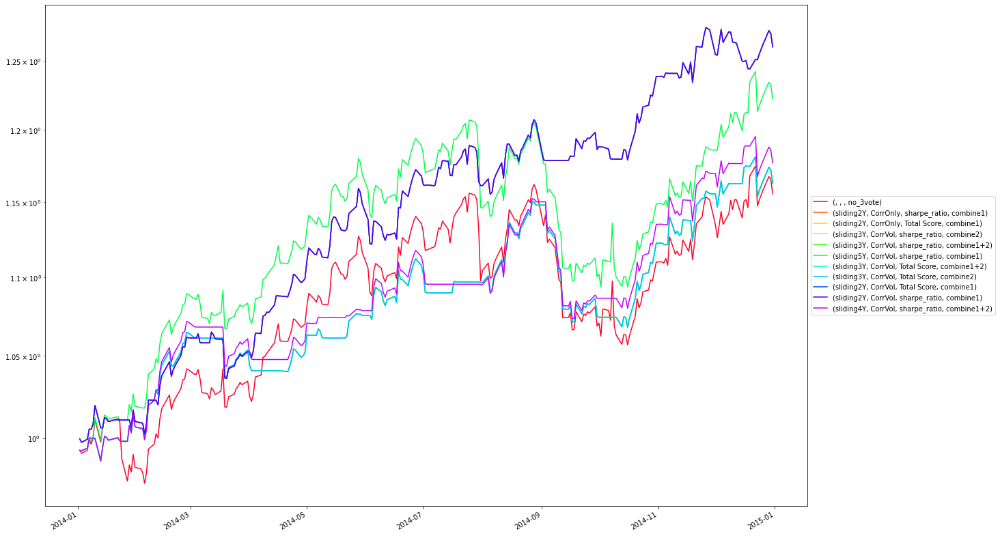

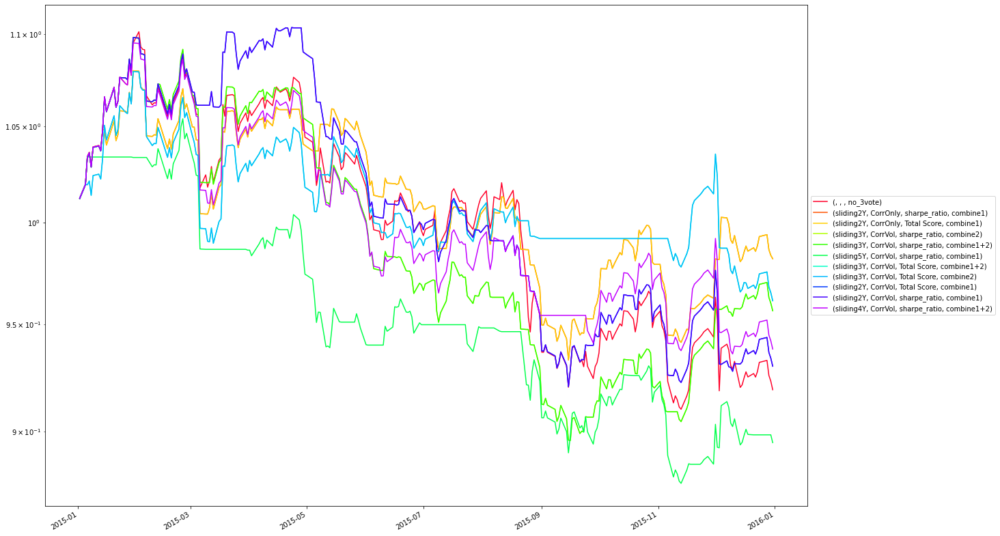

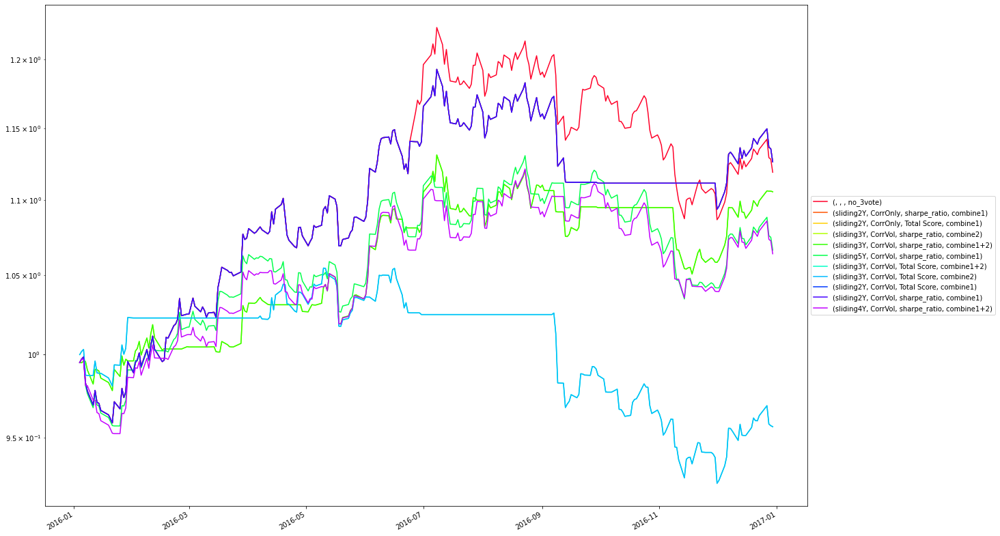

...

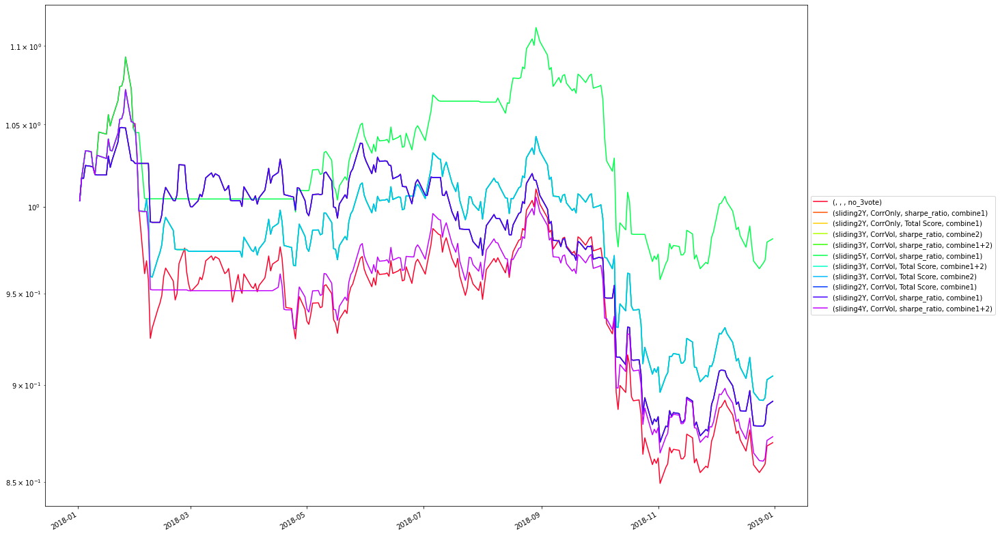

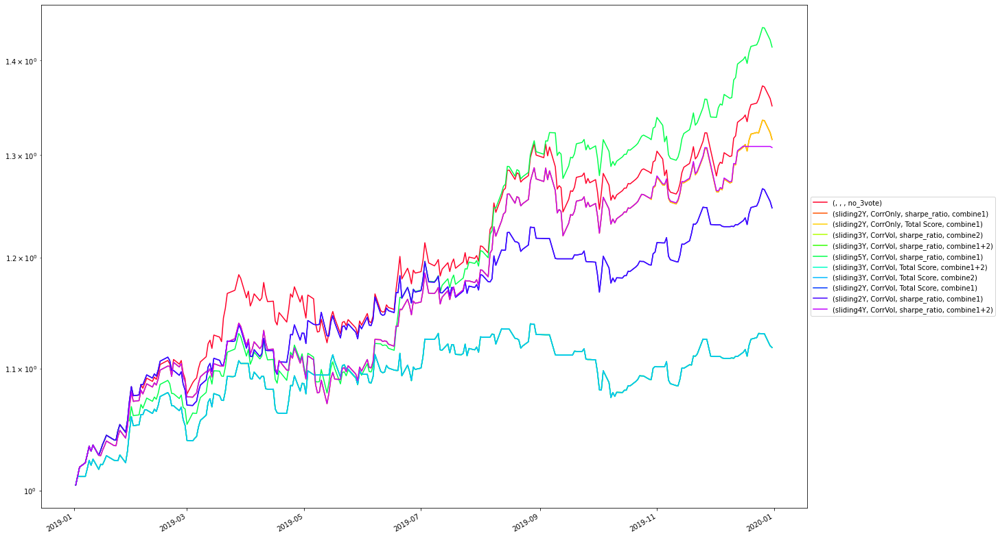

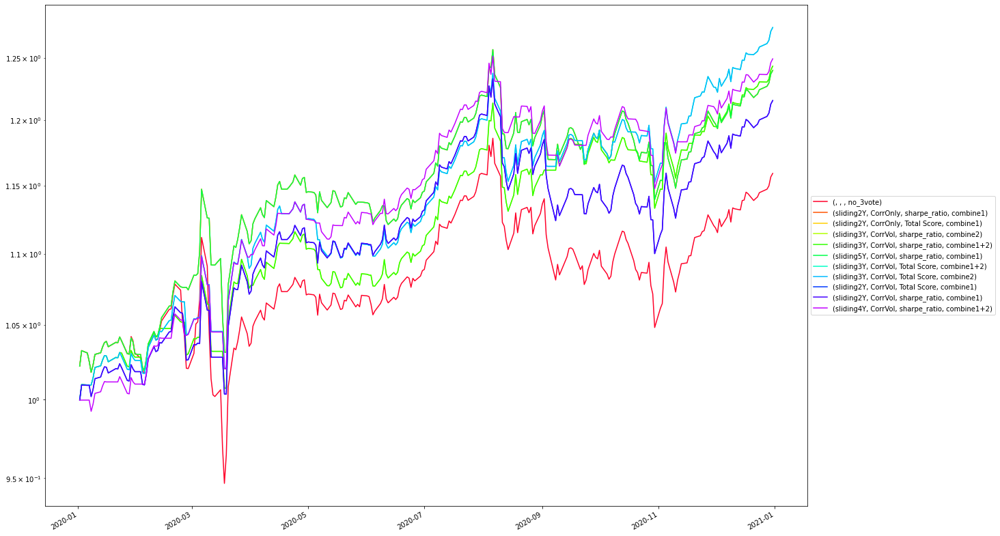

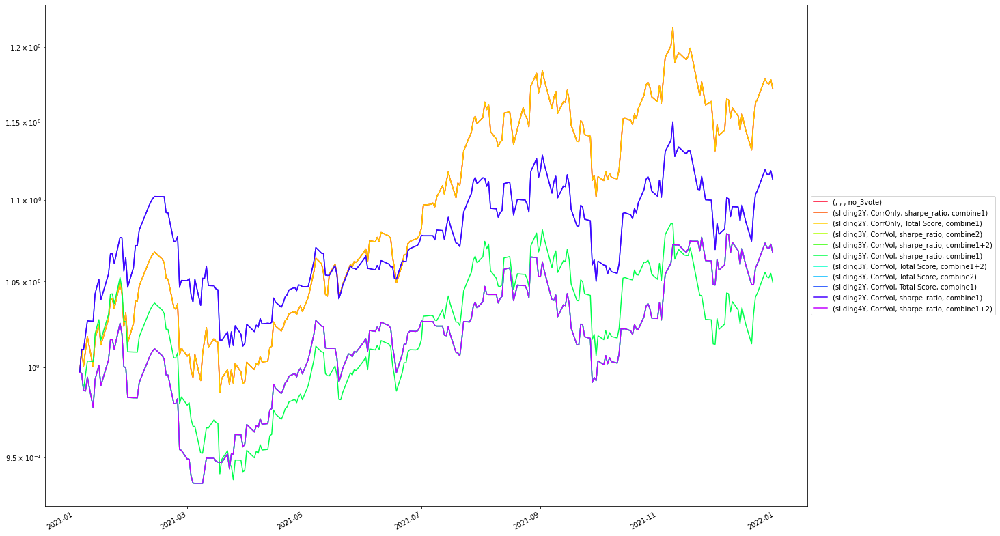

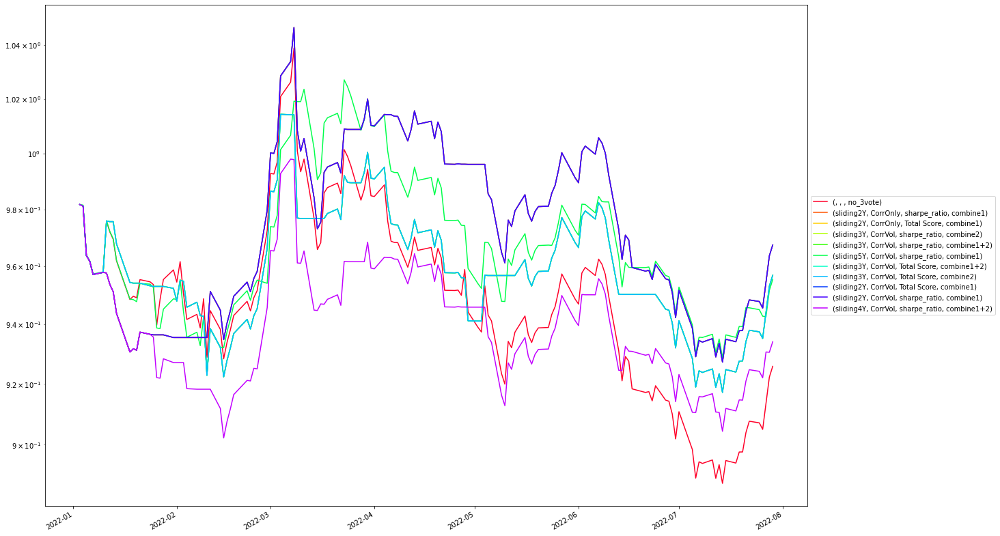

In [72]:
# ll = list(show_df.index[:10]) + [base_case_ret.index[0]]
show_ret = pd.concat([base_case_ret, all_ret_df[show_df.index[:10]]], axis=1)
show_ret = show_ret.dropna()
show_cum_ret(show_ret)
for yy in range(show_ret.index[0].year, show_ret.index[-1].year + 1):
    show_cum_ret(show_ret[str(yy)])

In [ ]:
groupby_items = ['sliding_year', 'case_pool', 'case_metrics', 'case_combine']

all_met_df_count = all_met_df.loc[all_met_df.index.get_level_values('case_combine') != base_case_name, :]
show_df_count = show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
base_met_single_index = base_case_met.copy()
base_met_single_index.index = [base_case_name]


for gb in groupby_items:
    print("================================================== ", gb)
    ser1 = show_df_count.groupby(gb).count().mean(axis=1)
    ser2 = all_met_df_count.groupby(gb).count().mean(axis=1)
    ser3 = ser1 / ser2
    df = pd.concat([ser1.to_frame(), ser2.to_frame(), ser3.to_frame()], axis=1)
    df.columns = ['better', 'total', 'pct']
    display(df)

    perf = all_met_df_count.groupby(gb).mean()
    perf = pd.concat([base_met_single_index, perf])
    display(perf)

    perf_std = all_met_df_count.groupby(gb).std()
    display(perf_std)

# cross compare

In [ ]:
cases_all_met_df = pd.concat(all_met_df_dict.values(), keys=all_ret_df_dict.keys())
cases_all_ret_df = pd.concat(all_ret_df_dict.values(), keys=all_ret_df_dict.keys(), axis=1)

# 13ETFs	v1	sliding1Y	2thresholds	combine2	no_3vote
idx_names = ['sliding_case', 'sliding_year', 'case_pool', 'case_metrics', 'case_combine']
cases_all_met_df.index.names = idx_names
cases_all_ret_df.columns.names = idx_names
cases_all_met_df

In [ ]:
base_case_name = 'no_3vote'
base_case_ret = cases_all_ret_df.loc[:, cases_all_ret_df.columns.get_level_values('case_combine') == base_case_name].iloc[:, [0]]
base_case_ret.columns = pd.MultiIndex.from_tuples([("", "", "", "", base_case_name)], names=idx_names)
# display(base_case_ret)
base_case_met = cases_all_met_df.loc[cases_all_met_df.index.get_level_values('case_combine') == base_case_name, :].iloc[[0], :]
base_case_met.index = pd.MultiIndex.from_tuples([("", "", "", "", base_case_name)], names=idx_names)
base_case_met

In [ ]:
cases_all_ret_df_fill = pd.DataFrame()

for i in range(2, 6):
    tmp = cases_all_ret_df.loc[:, cases_all_ret_df.columns.get_level_values('sliding_year') == 'sliding{}Y'.format(i)]
    tmp = pd.concat([base_case_ret, tmp], axis=1)
    tmp = tmp.fillna(method='ffill', axis=1)
    tmp = tmp.loc[:, tmp.columns.get_level_values('case_combine') != 'no_3vote']
    cases_all_ret_df_fill = pd.concat([cases_all_ret_df_fill, tmp], axis=1)
cases_all_ret_df_fill

In [ ]:
all_met_df_fill = empy_metric(cases_all_ret_df_fill.dropna())
all_met_df_fill = calculation_score(all_met_df_fill)
all_met_df_fill = pd.concat([all_met_df_fill, other_metric(cases_all_ret_df_fill.dropna())], axis=1)

In [ ]:
sort_by = 'sharpe_ratio'
sort_df = all_met_df_fill.sort_values(sort_by, ascending=False)
show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
# show_df = pd.concat([show_df, base_case_met])
show_df.head(20)

In [ ]:
sort_df.to_csv("./result/2022/cashON_signal/result/yearly_threshold/combine_met(2009-2022).csv")

In [ ]:
all_met_df_count = cases_all_met_df.loc[cases_all_met_df.index.get_level_values('case_combine') != base_case_name, :]
# perf = pd.concat([base_met_single_index, perf])#.sort_values(sort_by, ascending=False)

In [ ]:
all_met_df_save = pd.concat([base_case_met, all_met_df_count])
all_met_df_save.to_csv('./result/2022/cashON_signal/result/yearly_threshold/combine_met.csv')

In [ ]:
groupby_items = [
    ['sliding_case'], ['sliding_year'], ['sliding_year', 'sliding_case'], 
    ['case_pool'], ['case_pool', 'sliding_year', 'sliding_case'], 
    ['case_metrics'],
    ['case_combine'], ['case_combine', 'sliding_year', 'sliding_case']
]
sort_by = 'sharpe_ratio'

all_met_df_count = cases_all_met_df.loc[cases_all_met_df.index.get_level_values('case_combine') != base_case_name, :]
show_df_count = show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
base_met_single_index = base_case_met.copy()
# base_met_single_index.index = [base_case_name]


for gb in groupby_items:
    print("================================================== ", gb)
    ser1 = show_df_count.groupby(gb).count().mean(axis=1)
    ser2 = all_met_df_count.groupby(gb).count().mean(axis=1)
    ser3 = ser1 / ser2
    df = pd.concat([ser1.to_frame(), ser2.to_frame(), ser3.to_frame()], axis=1).fillna(0.0)
    df.columns = ['better', 'total', 'pct']
    display(df)

    perf = all_met_df_count.groupby(gb).mean()
    if len(gb) > 1:
        base_met_single_index.index = pd.MultiIndex.from_tuples([tuple([""]*(len(gb)-1)+[base_case_name])], names=gb)
    perf = pd.concat([base_met_single_index, perf])#.sort_values(sort_by, ascending=False)
    display(perf)

    perf_std = all_met_df_count.groupby(gb).std()
    display(perf_std)

# Corr + Vol

In [10]:
base_folder = './result/2022/cashON_signal/result/yearly_threshold/corr_vol/'
filter_case = ['13ETFs']

start = '2008'
end = '2022'

In [ ]:
all_ret = {}
all_met = {}
for f in os.listdir(base_folder):
    case_type = f.split('_')
    if case_type[0] not in filter_case:
        continue

    case_folder = os.path.join(base_folder, f)
    for f2 in os.listdir(case_folder):
        print(f, f2)
        if f2.split('_')[-1] != 'combine2':
            continue
        case_type2 = case_type + [f2.split('_')[0]]
        print(case_type2)

        ret = pd.read_csv(os.path.join(case_folder, f2, 'final_ret.csv'), index_col=0)
        names = ['case_metrics', 'case_combine']
        ret.columns = pd.MultiIndex.from_tuples([idx.rsplit("_", 1) if idx != "no_3vote" else ["", "no_3vote"] for idx in ret.columns], names=names)
        ret.index = pd.to_datetime(ret.index)
        all_ret[tuple(case_type2)] = ret
        met = pd.read_csv(os.path.join(case_folder, f2, 'final_metrics.csv'), index_col=0)
        names = ['case_metrics', 'case_combine']
        met.index = pd.MultiIndex.from_tuples([idx.rsplit("_", 1) if idx != "no_3vote" else ["", "no_3vote"] for idx in met.index], names=names)
        all_met[tuple(case_type2)] = met
    # break
all_ret_df = pd.concat(all_ret.values(), keys=all_ret.keys(), axis=1)
# all_met_df = pd.concat(all_met.values(), keys=all_met.keys())

In [12]:
# 13ETFs	v1	sliding1Y	2thresholds	combine2	no_3vote
idx_names = ['assets_pool', 'correlate_assets', 'sliding_year', 'case_metrics', 'case_combine']
all_ret_df.columns.names = idx_names
# all_met_df.index.names = idx_names

In [ ]:
all_met_df = empy_metric(all_ret_df.dropna())
all_met_df = calculation_score(all_met_df)
all_met_df = pd.concat([all_met_df, other_metric(all_ret_df.dropna())], axis=1)
all_met_df

In [ ]:
base_case_name = 'no_3vote'
base_case_ret = all_ret_df.loc[:, all_ret_df.columns.get_level_values('case_combine') == base_case_name].iloc[:, [0]]
base_case_ret.columns = pd.MultiIndex.from_tuples([(base_case_ret.columns.get_level_values(0)[0], "", "", "", base_case_name)], names=idx_names)
# display(base_case_ret)
base_case_met = all_met_df.loc[all_met_df.index.get_level_values('case_combine') == base_case_name, :].iloc[[0], :]
base_case_met.index = pd.MultiIndex.from_tuples([(base_case_met.index.get_level_values(0)[0], "", "", "", base_case_name)], names=idx_names)
base_case_met

In [ ]:
sort_by = 'sharpe_ratio'
sort_df = all_met_df.sort_values(sort_by, ascending=False)
show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
show_df = pd.concat([show_df, base_case_met])
show_df.head(20)

In [ ]:
show_ret = pd.concat([base_case_ret, all_ret_df[show_df.index[:10]]])
show_cum_ret(show_ret['2013'])

In [ ]:
groupby_items = ['correlate_assets', 'sliding_year', 'case_metrics', 'case_combine']

all_met_df_count = all_met_df.loc[all_met_df.index.get_level_values('case_combine') != base_case_name, :]
show_df_count = show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
base_met_single_index = base_case_met.copy()
base_met_single_index.index = [base_case_name]


for gb in groupby_items:
    print("================================================== ", gb)

    ser1 = show_df_count.groupby(gb).count().mean(axis=1)
    ser2 = all_met_df_count.groupby(gb).count().mean(axis=1)
    ser3 = ser1 / ser2
    df = pd.concat([ser1.to_frame(), ser2.to_frame(), ser3.to_frame()], axis=1)
    df.columns = ['better', 'total', 'pct']
    display(df)

    perf = all_met_df_count.groupby(gb).mean()
    perf = pd.concat([base_met_single_index, perf])
    display(perf)

    perf_std = all_met_df_count.groupby(gb).std()
    display(perf_std)

# Vol only

In [ ]:
base_folder = './result/2022/cashON_signal/result/yearly_threshold/vol_Only/'
filter_case = ['13ETFs']

start = '2008'
end = '2022'

In [ ]:
all_ret = {}
all_met = {}
for f in os.listdir(base_folder):
    case_type = f.split('_')
    if case_type[0] not in filter_case:
        continue

    case_folder = os.path.join(base_folder, f)
    for f2 in os.listdir(case_folder):
        print(f, f2)
        if f2.split('_')[-1] != 'combine2':
            continue
        case_type2 = case_type + [f2.split('_')[0]]
        print(case_type2)

        ret = pd.read_csv(os.path.join(case_folder, f2, 'final_ret.csv'), index_col=0)
        names = ['case_metrics', 'case_combine']
        ret.columns = pd.MultiIndex.from_tuples([idx.rsplit("_", 1) if idx != "no_3vote" else ["", "no_3vote"] for idx in ret.columns], names=names)
        ret.index = pd.to_datetime(ret.index)
        all_ret[tuple(case_type2)] = ret
        met = pd.read_csv(os.path.join(case_folder, f2, 'final_metrics.csv'), index_col=0)
        names = ['case_metrics', 'case_combine']
        met.index = pd.MultiIndex.from_tuples([idx.rsplit("_", 1) if idx != "no_3vote" else ["", "no_3vote"] for idx in met.index], names=names)
        all_met[tuple(case_type2)] = met
    # break
all_ret_df = pd.concat(all_ret.values(), keys=all_ret.keys(), axis=1)
# all_met_df = pd.concat(all_met.values(), keys=all_met.keys())

In [ ]:
# 13ETFs	v1	sliding1Y	2thresholds	combine2	no_3vote
idx_names = ['assets_pool', 'correlate_assets', 'sliding_year', 'case_metrics', 'case_combine']
all_ret_df.columns.names = idx_names
# all_met_df.index.names = idx_names

In [ ]:
all_met_df = empy_metric(all_ret_df.dropna())
all_met_df = calculation_score(all_met_df)
all_met_df = pd.concat([all_met_df, other_metric(all_ret_df.dropna())], axis=1)
all_met_df

In [ ]:
base_case_name = 'no_3vote'
base_case_ret = all_ret_df.loc[:, all_ret_df.columns.get_level_values('case_combine') == base_case_name].iloc[:, [0]]
base_case_ret.columns = pd.MultiIndex.from_tuples([(base_case_ret.columns.get_level_values(0)[0], "", "", "", base_case_name)], names=idx_names)
# display(base_case_ret)
base_case_met = all_met_df.loc[all_met_df.index.get_level_values('case_combine') == base_case_name, :].iloc[[0], :]
base_case_met.index = pd.MultiIndex.from_tuples([(base_case_met.index.get_level_values(0)[0], "", "", "", base_case_name)], names=idx_names)
base_case_met

In [ ]:
sort_by = 'sharpe_ratio'
sort_df = all_met_df.sort_values(sort_by, ascending=False)
show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
show_df = pd.concat([show_df, base_case_met])
show_df.head(20)

In [ ]:
show_df.tail(20)

In [ ]:
groupby_items = ['correlate_assets', 'sliding_year', 'case_metrics', 'case_combine']

all_met_df_count = all_met_df.loc[all_met_df.index.get_level_values('case_combine') != base_case_name, :]
show_df_count = show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
base_met_single_index = base_case_met.copy()
base_met_single_index.index = [base_case_name]


for gb in groupby_items:
    print("================================================== ", gb)

    ser1 = show_df_count.groupby(gb).count().mean(axis=1)
    ser2 = all_met_df_count.groupby(gb).count().mean(axis=1)
    ser3 = ser1 / ser2
    df = pd.concat([ser1.to_frame(), ser2.to_frame(), ser3.to_frame()], axis=1)
    df.columns = ['better', 'total', 'pct']
    display(df)

    perf = all_met_df_count.groupby(gb).mean()
    perf = pd.concat([base_met_single_index, perf])
    display(perf)

    perf_std = all_met_df_count.groupby(gb).std()
    display(perf_std)

In [ ]:
base_folder = './result/2022/cashON_signal/result/yearly_threshold/single_metrics/'
filter_case = ['longhistory']

start = '1987'
end = '2022'

In [ ]:
all_ret = {}
all_met = {}
for f in os.listdir(base_folder):
    case_type = f.split('_')
    if case_type[0] not in filter_case:
        continue

    case_folder = os.path.join(base_folder, f)
    for f2 in os.listdir(case_folder):
        print(f, f2)
        case_type2 = case_type + f2.split('_')
        print(case_type2)

        ret = pd.read_csv(os.path.join(case_folder, f2, 'final_ret.csv'), index_col=0)
        ret.index = pd.to_datetime(ret.index)
        all_ret[tuple(case_type2)] = ret
        met = pd.read_csv(os.path.join(case_folder, f2, 'final_metrics.csv'), index_col=0)
        all_met[tuple(case_type2)] = met
    # break
all_ret_df = pd.concat(all_ret.values(), keys=all_ret.keys(), axis=1)
all_met_df = pd.concat(all_met.values(), keys=all_met.keys())

In [ ]:
idx_names = ['assets_pool', 'correlate_assets', 'sliding_year', 'thresholds_#', 'combine_#', 'case']
all_ret_df.columns.names = idx_names
all_met_df.index.names = idx_names

In [ ]:
base_case_name = 'no_3vote'
base_case_ret = all_ret_df.loc[:, all_ret_df.columns.get_level_values('case') == base_case_name].iloc[:, [0]]
base_case_ret.columns = pd.MultiIndex.from_tuples([(base_case_ret.columns.get_level_values(0)[0], "", "", "", "", base_case_name)], names=idx_names)
# display(base_case_ret)
base_case_met = all_met_df.loc[all_met_df.index.get_level_values('case') == base_case_name, :].iloc[[0], :]
base_case_met.index = pd.MultiIndex.from_tuples([(base_case_met.index.get_level_values(0)[0], "", "", "", "", base_case_name)], names=idx_names)
base_case_met

In [ ]:
sort_by = 'sharpe_ratio'
sort_df = all_met_df.sort_values(sort_by, ascending=False)
show_df = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
show_df = pd.concat([show_df, base_case_met])
show_df

In [ ]:
groupby_items = ['correlate_assets', 'sliding_year', 'thresholds_#', 'combine_#', 'case']

all_met_df_count = all_met_df.loc[all_met_df.index.get_level_values('case') != base_case_name, :]
show_df_count = sort_df[sort_df[sort_by] > base_case_met[sort_by].values[0]]
base_met_single_index = base_case_met.copy()
base_met_single_index.index = [base_case_name]


for gb in groupby_items:
    print("================================================== ", gb)
    ser1 = show_df_count.groupby(gb).count().mean(axis=1)
    ser2 = all_met_df_count.groupby(gb).count().sum(axis=1)
    ser3 = ser1 / ser2
    df = pd.concat([ser1.to_frame(), ser2.to_frame(), ser3.to_frame()], axis=1)
    df.columns = ['better', 'total', 'pct']
    display(df)

    perf = all_met_df_count.groupby(gb).mean()
    perf = pd.concat([base_met_single_index, perf])
    display(perf)

In [ ]:
y_file_dict = {
    'pfrb3030xxz': './data/data_price/data_price(pfrb_3030_xxz).csv',
    'pfrb3030xzz': './data/data_price/data_price(pfrb_3030_xzz).csv',
    'pfrb3030zzz': './data/data_price/data_price(pfrb_3030_zzz).csv',
    'pfrbWithBL': './data/data_price/data_price(1411_2008_202204_pred_vote_all_v25_agg_before_commission).csv'
}

price_df = pd.DataFrame()
for ccc, y_file in y_file_dict.items():
    sub_price_df = pd.read_csv(y_file, index_col=0).iloc[:, 0]
    sub_price_df.name = ccc
    price_df = pd.concat([price_df, sub_price_df], axis=1)

price_df.index = pd.to_datetime(price_df.index, format='%Y-%m-%d')#.date
ret_df = -price_df.pct_change(-1).dropna(how='all')
true_ret = price_df.pct_change(limit=1).dropna(how='all')
true_up = (true_ret>=0).astype(int)

In [ ]:
return_dict = {
    'pfrb3030xxz': './result/2022/portfolioY/pfrb3030_preds_diffcontONOFF_pfrb3030xxz_comm_return.csv',
    'pfrb3030xzz': './result/2022/portfolioY/pfrb3030_preds_diffcontONOFF_pfrb3030xzz_comm_return.csv',
    'pfrb3030zzz': './result/2022/portfolioY/pfrb3030zzz_preds_diffcontONOFF_pfrb3030zzz_comm_return.csv',
    'pfrbWithBL': './result/2022/portfolioY/pfrbWithBL_preds_diffcontONOFF_pfrbWithBL_comm_return.csv',
}

return_df_dict = {}
for key, file in return_dict.items():
    sub_return_df = pd.read_csv(file, index_col=0)
    sub_return_df = sub_return_df.rename(columns={"no 3vote" : "{}_no3vote".format(key)})
    return_df_dict[key] = sub_return_df
# return_df = pd.concat(return_df_dict.values(), keys=return_df_dict.keys(), axis=1)
return_df = pd.concat(return_df_dict.values(), axis=1)
return_df.index = pd.to_datetime(return_df.index)
return_df

In [ ]:
return_correct_comm = return_df.dropna()
return_correct_comm

In [ ]:
all_best = []
for ccc in ['pfrbWithBL', 'pfrb3030xxz', 'pfrb3030xzz', 'pfrb3030zzz']:
    print("++++++++++++++++++++++++++++++++++ {} ++++++++++++++++++++++++++++++++++".format(ccc))
    list_tmp = ["{}_no3vote".format(ccc)] + [i for i in return_correct_comm.columns if (ccc in i) and (i.endswith('vote_down_buy_0'))]# and (i.endswith('vote_down_buy_0'))
    ret_tmp = return_correct_comm[list_tmp].dropna()
    strategy_list_sel = print_all_result(ret_tmp, true_up[ccc].dropna(), true_ret[ccc].dropna(), topn=10, base_case=["{}_no3vote".format(ccc)])
    all_best += strategy_list_sel
    # print_all_result(ret_tmp["2014":"2015"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
    # print_all_result(ret_tmp["2016":"2018"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
    # print_all_result(ret_tmp["2019":"2022"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
all_best

In [ ]:
plot_cum_return(return_correct_comm[all_best])

In [ ]:
all_best = []
for ccc in ['pfrbWithBL', 'pfrb3030xxz', 'pfrb3030xzz', 'pfrb3030zzz']:
    print("++++++++++++++++++++++++++++++++++ {} ++++++++++++++++++++++++++++++++++".format(ccc))
    list_tmp = ["{}_no3vote".format(ccc)] + [i for i in return_correct_comm.columns if (ccc in i) and ('voteAll' in i) and (i.endswith('vote_down_buy_0'))]
    ret_tmp = return_correct_comm[list_tmp].dropna()
    strategy_list_sel = print_all_result(ret_tmp, true_up[ccc].dropna(), true_ret[ccc].dropna(), topn=10, base_case=["{}_no3vote".format(ccc)])
    all_best += strategy_list_sel
    # print_all_result(ret_tmp["2014":"2015"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
    # print_all_result(ret_tmp["2016":"2018"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
    # print_all_result(ret_tmp["2019":"2022"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
all_best

In [ ]:
plot_cum_return(return_correct_comm[all_best])

In [ ]:
all_best = []
for ccc in ['pfrbWithBL', 'pfrb3030xxz', 'pfrb3030xzz', 'pfrb3030zzz']:
    print("++++++++++++++++++++++++++++++++++ {} ++++++++++++++++++++++++++++++++++".format(ccc))
    list_tmp = ["{}_no3vote".format(ccc)] + [i for i in return_correct_comm.columns if (ccc in i) and ('voteAll' in i)]
    ret_tmp = return_correct_comm[list_tmp].dropna()
    strategy_list_sel = print_all_result(ret_tmp, true_up[ccc].dropna(), true_ret[ccc].dropna(), topn=10, base_case=["{}_no3vote".format(ccc)])
    all_best += strategy_list_sel
    # print_all_result(ret_tmp["2014":"2015"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
    # print_all_result(ret_tmp["2016":"2018"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
    # print_all_result(ret_tmp["2019":"2022"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
all_best

In [ ]:
plot_cum_return(return_correct_comm[all_best])

In [ ]:
plot_cases = [
    '_TLT___freqM___vote_down_buy_0.3',
    '_TLT_weighted___cont4_rb_lookback___vote_down_buy_0.3',
    '_2vote_pp5_weighted___freqM___vote_down_buy_0.2',
    '_TLT___freqM___vote_down_buy_0',
    '_TLT_weighted___cont4_rb_lookback___vote_down_buy_0',
    '_2vote_pp5_weighted___freqM___vote_down_buy_0',
    '_2vote_pp5___freqM___vote_down_buy_0',
    '_3vote_pp10___cont4ON-cont2OFF_rb_lookback___vote_down_buy_0.3',
    '_3vote_pp10___cont4ON-cont2OFF_rb_lookback___vote_down_buy_0'
]

# total_list_tmp = []
list_tmp = []
for pf in ['pfrbWithBL', 'pfrb3030xxz', 'pfrb3030xzz', 'pfrb3030zzz']:
    print("++++++++++++++++++++++++++++++++++ {} ++++++++++++++++++++++++++++++++++".format(pf))
    list_tmp = ["{}_no3vote".format(pf)]
    for ccc in plot_cases:
        # list_tmp += [i for i in return_correct_comm.columns if (case in i) and (i.endswith('vote_down_buy_0'))]
        print("         ============================= {} =============================".format(ccc))
        list_tmp += [i for i in return_correct_comm.columns if ('voteAll' in i) and (i.endswith(ccc)) and (pf in i)]# and (i.endswith('vote_down_buy_0'))
    ret_tmp = return_correct_comm[list_tmp].dropna()
    strategy_list_sel = print_all_result(ret_tmp, true_up[pf].dropna(), true_ret[pf].dropna(), topn=len(ret_tmp), base_case=["{}_no3vote".format(pf)])
        # print_all_result(ret_tmp["2014":"2015"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
        # print_all_result(ret_tmp["2016":"2018"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
        # print_all_result(ret_tmp["2019":"2022"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])


    # plot_cum_return(return_correct_comm[all_best])


In [ ]:
plot_cases = [
    # no 3vote
    # 'no3vote',
    # pfrbWithBL
    # 'Combined_2vote_asset2pp___cont4ON-cont2OFF_rb_lookback',
    # '2vote_pp5___cont4ON-cont2OFF_rb_lookback',
    # pfrb3030xxz
    '_TLT___freqM___vote_down_buy_0.3',
    '_TLT_weighted___cont4_rb_lookback___vote_down_buy_0.3',
    '_2vote_pp5_weighted___freqM___vote_down_buy_0.2'
    # pfrb3030xzz
    # 'TLT___freqM',
    # '2vote_pp5_weighted___cont2ON-cont4OFF'

]

# total_list_tmp = []
list_tmp = []
for ccc in plot_cases:
    print("++++++++++++++++++++++++++++++++++ {} ++++++++++++++++++++++++++++++++++".format(ccc))
    all_best = []
    for pf in ['pfrbWithBL', 'pfrb3030xxz', 'pfrb3030xzz', 'pfrb3030zzz']:
        # list_tmp += [i for i in return_correct_comm.columns if (case in i) and (i.endswith('vote_down_buy_0'))]
        print("         ============================= {} =============================".format(pf))
        list_tmp = ["{}_no3vote".format(pf)] + [i for i in return_correct_comm.columns if ('voteAll' in i) and (ccc in i) and (pf in i)]# and (i.endswith('vote_down_buy_0'))
        ret_tmp = return_correct_comm[list_tmp].dropna()
        strategy_list_sel = print_all_result(ret_tmp, true_up[pf].dropna(), true_ret[pf].dropna(), topn=len(ret_tmp), base_case=["{}_no3vote".format(pf)])
        # print_all_result(ret_tmp["2014":"2015"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
        # print_all_result(ret_tmp["2016":"2018"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
        # print_all_result(ret_tmp["2019":"2022"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])

        all_best += strategy_list_sel

    plot_cum_return(return_correct_comm[all_best])



In [ ]:
plot_cases = [
    # no 3vote
    # 'no3vote',
    '_3vote_pp5_weighted_',
    '_3vote_pp5_',
    '_Combined_3vote_asset2pp_',
    # '_pp5_TIP_',
    '_Combined_3vote_pp_weighted2asset_weighted_'



]

# total_list_tmp = []
list_tmp = []
for ccc in plot_cases:
    print("++++++++++++++++++++++++++++++++++ {} ++++++++++++++++++++++++++++++++++".format(ccc))
    all_best = []
    for pf in ['pfrbWithBL', 'pfrb3030xxz', 'pfrb3030xzz']:
        # list_tmp += [i for i in return_correct_comm.columns if (case in i) and (i.endswith('vote_down_buy_0'))]
        print("         ============================= {} =============================".format(pf))
        list_tmp = ["{}_no3vote".format(pf)] + [i for i in return_correct_comm.columns if ('voteAll' in i) and (ccc in i) and (pf in i) and (i.endswith('vote_down_buy_0'))]# and (i.endswith('vote_down_buy_0'))
        ret_tmp = return_correct_comm[list_tmp].dropna()
        strategy_list_sel = print_all_result(ret_tmp, true_up[pf].dropna(), true_ret[pf].dropna(), topn=10, base_case=["{}_no3vote".format(pf)])
        # print_all_result(ret_tmp["2014":"2015"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
        # print_all_result(ret_tmp["2016":"2018"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
        # print_all_result(ret_tmp["2019":"2022"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])

        all_best += strategy_list_sel

    plot_cum_return(return_correct_comm[all_best])

In [ ]:
# highlight > 0.8 and overlap

plot_cases = [
    # no 3vote
    # 'no3vote',
    '_3vote_pp5_weighted___cont4ON-cont2OFF_rb_lookback___',
    '_3vote_pp5_weighted___cont4ON-cont3OFF_rb_lookback___',
    '_3vote_pp5_weighted___cont3ON-cont2OFF_rb_lookback___',
    # '_3vote_pp5_',
    # '_Combined_3vote_asset2pp_',
    # # '_pp5_TIP_',
    # '_Combined_3vote_pp_weighted2asset_weighted_'



]

# total_list_tmp = []
list_tmp = []
for ccc in plot_cases:
    print("++++++++++++++++++++++++++++++++++ {} ++++++++++++++++++++++++++++++++++".format(ccc))
    all_best = []
    for pf in ['pfrbWithBL', 'pfrb3030xxz', 'pfrb3030xzz']:
        # list_tmp += [i for i in return_correct_comm.columns if (case in i) and (i.endswith('vote_down_buy_0'))]
        print("         ============================= {} =============================".format(pf))
        list_tmp = ["{}_no3vote".format(pf)] + [i for i in return_correct_comm.columns if ('voteAll' in i) and (ccc in i) and (pf in i)]# and (i.endswith('vote_down_buy_0'))
        ret_tmp = return_correct_comm[list_tmp].dropna()
        strategy_list_sel = print_all_result(ret_tmp, true_up[pf].dropna(), true_ret[pf].dropna(), topn=10, base_case=["{}_no3vote".format(pf)])
        # print_all_result(ret_tmp["2014":"2015"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
        # print_all_result(ret_tmp["2016":"2018"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])
        # print_all_result(ret_tmp["2019":"2022"], true_up[ccc].dropna(), true_ret[ccc].dropna(), strategy_list_sel=strategy_list_sel, base_case=["{}_no3vote".format(ccc)])

        all_best += strategy_list_sel

    plot_cum_return(return_correct_comm[all_best])

In [ ]:
metric_dict = {
    'pfrb3030xxz': './result/2022/portfolioY/pfrb3030_preds_diffcontONOFF_pfrb3030xxz_empy_metric(2014-2022).csv',
    'pfrb3030xzz': './result/2022/portfolioY/pfrb3030_preds_diffcontONOFF_pfrb3030xzz_empy_metric(2014-2022).csv',
    'pfrb3030zzz': './result/2022/portfolioY/pfrb3030zzz_preds_diffcontONOFF_pfrb3030zzz_empy_metric(2014-2022).csv',
    'pfrbWithBL': './result/2022/portfolioY/pfrbWithBL_preds_diffcontONOFF_pfrbWithBL_empy_metric(2014-2022).csv',
}

metric_df_dict = {}
for key, file in metric_dict.items():
    sub_return_df = pd.read_csv(file, index_col=0)
    sub_return_df = sub_return_df.rename(index={"no 3vote" : "{}_no3vote".format(key)})
    metric_df_dict[key] = sub_return_df
# return_df = pd.concat(return_df_dict.values(), keys=return_df_dict.keys(), axis=1)
metric_df = pd.concat(metric_df_dict.values())
# metric_df.index = pd.to_datetime(metric_df.index)
metric_df

In [ ]:
# metric_df['case']
raw_case = []
pf_case = []
for c in metric_df.index:
    # print(c)
    last_pf = ""
    for pf in ['pfrbWithBL', 'pfrb3030xxz', 'pfrb3030xzz', 'pfrb3030zzz']:
        if pf in c:
            # print("  ", pf)
            c = c.replace(pf+'_', "")
            last_pf = pf
            break
    if last_pf == "":
        print(c)
    pf_case.append(last_pf)
    raw_case.append(c)
raw_case_df = pd.DataFrame(pf_case, index=metric_df.index)
raw_case_df

In [ ]:
metric_df['raw_case'] = raw_case
metric_df['pf_case'] = pf_case
metric_df

In [ ]:
metric_df[metric_df['pf_case'].isin(['pfrb3030xxz', 'pfrb3030xzz', 'pfrb3030zzz'])].groupby('raw_case').count()

In [ ]:
metric_df_mean = metric_df[metric_df['pf_case'].isin(['pfrb3030xxz', 'pfrb3030xzz', 'pfrb3030zzz'])].groupby('raw_case').mean()
metric_df_mean.sort_values('sharpe_ratio')['no3vote':]

In [ ]:
metric_df_mean.sort_values('sharpe_ratio').to_csv('average_metric_3pfrb3030.csv')

In [ ]:
files = [
    './result/2022/portfolioY/pfrbWithBL_preds_diffcontONOFF_preds.csv',
    './result/2022/portfolioY/pfrb3030zzz_preds_diffcontONOFF_preds.csv',
    './result/2022/portfolioY/pfrb3030_preds_diffcontONOFF_preds.csv'
]
pred = pd.DataFrame()
for f in files:
    sub_return_df = pd.read_csv(f, index_col=0)
    sub_return_df.index = pd.to_datetime(sub_return_df.index)
    pred = pd.concat([pred, sub_return_df], axis=1)
# pred.index = pd.to_datetime(pred.index)
pred

In [ ]:
ccase = [
    '_TLT___freqM', '_TLT_weighted___cont4_rb_lookback',
    '_2vote_pp5_weighted___freqM',
    '_3vote_pp10___cont4ON-cont2OFF_rb_lookback',
    '_2vote_pp5___freqM'
]

usecol = []
for c in ccase:
    for col in pred:
        if ("voteAll_" in col) and (c in col):
            print(col)
            usecol.append(col)
usecol

In [ ]:
sub_pred = pred[usecol]
sub_pred

In [ ]:
sub_pred.to_csv("./result/2022/portfolioY/best_choose.csv")

In [ ]:
metric_dict = {
    'pfrb3030xxz': './result/2022/portfolioY/pfrb3030_preds_diffcontONOFF_pfrb3030xxz_empy_metric(2014-2022).csv',
    'pfrb3030xzz': './result/2022/portfolioY/pfrb3030_preds_diffcontONOFF_pfrb3030xzz_empy_metric(2014-2022).csv',
    'pfrb3030zzz': './result/2022/portfolioY/pfrb3030zzz_preds_diffcontONOFF_pfrb3030zzz_empy_metric(2014-2022).csv',
    'pfrbWithBL': './result/2022/portfolioY/pfrbWithBL_preds_diffcontONOFF_pfrbWithBL_empy_metric(2014-2022).csv',
}

metric_df_dict = {}
for key, file in metric_dict.items():
    sub_return_df = pd.read_csv(file, index_col=0)
    sub_return_df = sub_return_df.rename(index={"no 3vote" : "{}_no3vote".format(key)})
    metric_df_dict[key] = sub_return_df
# return_df = pd.concat(return_df_dict.values(), keys=return_df_dict.keys(), axis=1)
metric_df = pd.concat(metric_df_dict.values())
# metric_df.index = pd.to_datetime(metric_df.index)
metric_df